### Training custom modality-specific U-Net models with coarse disease localizations for improved Tuberculosis segmentation and localization
At present, machine learning, particularly deep learning (DL) has drawn tremendous attention and has demonstrated state-of-the-art performance toward natural and medical image analyses. DL models are shown to be effective, particularly for medical image analysis tasks, including segmentation, classification, and visual quality assessment. Convolutional neural network (CNN)-based segmentation models like U-Nets have delivered superior segmentation performance toward natural and medical image segmentation tasks compared to conventional threshold-, region-, and clustering-based methods. Literature studies reveal that using medical modality-specific pretrained DL models helps transfer modality-specific knowledge to a relevant target task compared to those pretrained on stock photographic images, thereby improving model adaptation, generalization, and class-specific region of interest (ROI) localization. In this study, we propose the benefits offered through training custom chest X-ray (CXR) modality-specific U-Net models toward segmenting the lungs and Tuberculosis (TB)-related manifestations using CXRs. We further evaluate segmentation performance by augmenting the training data with coarse TB localizations produced by the best-performing classification model. Such augmentation is proposed to improve performance with the test data derived from the same training distribution and with other cross-institutional test collections. To this end, we observed that the combination of CXR modality-specific pretraining and augmented training helped the U-Net models to achieve superior performance toward TB segmentation and localization. We believe that this is the first study to i) use custom, CXR modality-specific U-Nets to segment lungs and TB-specific disease manifestations using CXRs; ii) evaluate the segmentation performance while augmenting the training data with coarse disease localizations; and, (iii) evaluate segmentation performance with cross-institutional test collections to observe model robustness and generalization.

In this study, we address the aforesaid limitations through a stage-wise, organized methodology, as follows: (i) First, we retrain the ImageNet-pretrained DL models on a large-scale collection of  CXR images to make the weight layers specific to the CXR modality and help learn CXR modality-specific feature representations; (ii) second, we propose CXR modality-specific VGG-16 and VGG-19 U-Net models to improve performance in the lung segmentation task; (iii) next, we perform a knowledge transfer from CXR modality-specific pretrained DL models and fine-tune them to classify CXRs as showing normal lungs or other pulmonary TB manifestations. The best performing model is used to coarsely localize the TB-specific ROI using saliency maps and class-selective relevance mapping (CRM) methods using the patient-specific test data. The localized ROI is then converted into bounding box masks; (iv) further, the proposed CXR modality-specific and other state-of-the-art U-Net model variants used in this study are trained and evaluated to segment TB manifestations using CXRs. We performed cross-institutional testing with the publicly available Shenzhen TB CXR and Montgomery TB CXR collections to evaluate model robustness and generalization; and (v) finally, we augment the training data in (iv) with the coarse disease ROI masks generated in (iii) and their associated original CXRs to evaluate for an improvement in TB segmentation performance with the test data used in (iv) and with other cross-institutional datasets including the Shenzhen TB CXR and Montgomery TB CXR collections. The figures below illustrate the aforementioned steps toward the current study and the datasets and their disctribution at various levels of the study. 

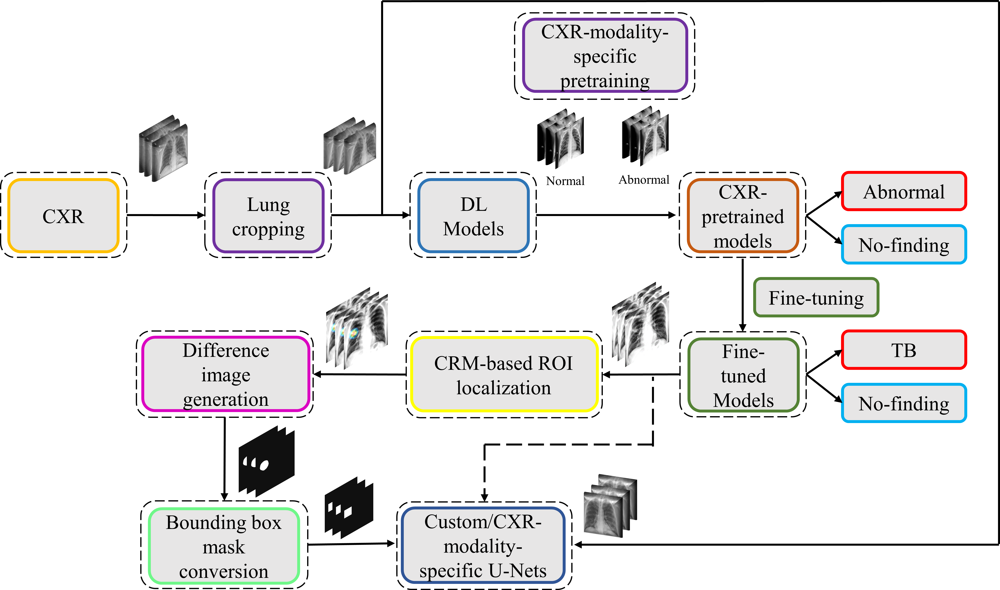

In [12]:
#this is the graphical abstract of the proposed study
from IPython.display import Image
Image("striking_image.png", width = 900, height = 900)

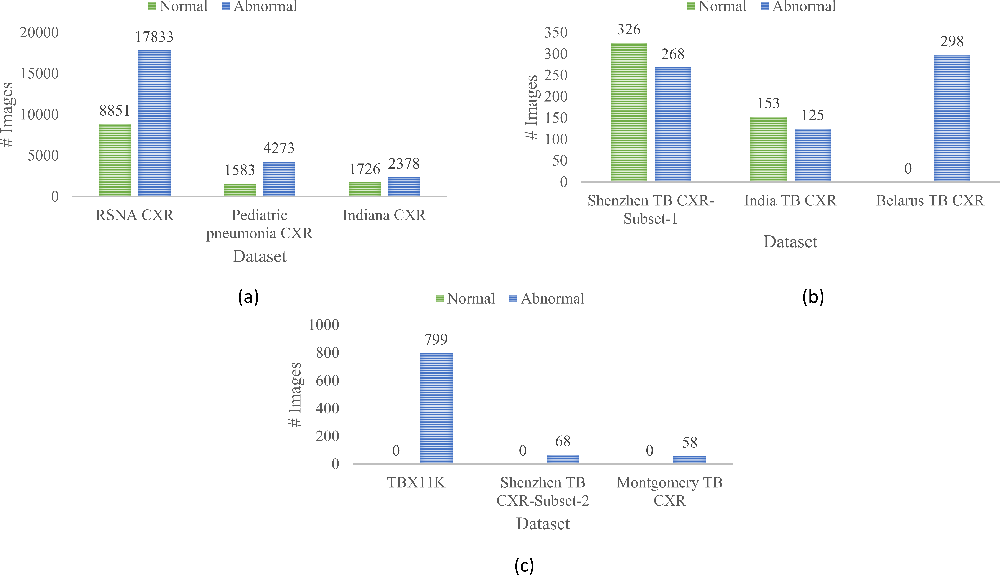

In [11]:
#this is the graphical abstract of the proposed study
from IPython.display import Image
Image("datasets_distribution.png", width = 900, height = 900)

In [ ]:
import os
os.getcwd()

### Step 1: Perform super resolution of the input images

In [ ]:
#%% load libraries

import tensorflow as tf
tf.keras.backend.clear_session()

import time
import numpy as np
from tqdm import tqdm
import math
import tensorflow as tf
from keras.utils import multi_gpu_model
from keras.models import Model, model_from_json
import glob
import shutil
import numpy as np
import zlib
from skimage import img_as_ubyte
from skimage.util import img_as_float
from keras.optimizers import Adam
from keras import backend as K
import struct
from keras.losses import mean_absolute_error
from keras.layers import Conv2D, BatchNormalization, Input, add, Activation
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
import cv2
from PIL import Image
from skimage.measure import compare_ssim
from matplotlib import pyplot as plt
from keras.preprocessing import image
import imageio
import os
#os.environ["CUDA_VISIBLE_DEVICES"] = "0,1" #if using multiple gpus, otherwise comment

In [ ]:
#%% function to load train and test images

def to_dirname(name):
    if name[-1:] == '/':
        return name
    else:
        return name + '/'
    
def show(image):
    image = image[0] * 255
    image = image.astype(np.uint8)
    image = Image.fromarray(image)
    image.show()
    
def load_images_test(name, size):
    x_images = []
    y_images = []
    for file in tqdm(os.listdir(name)):
        image = Image.open(name+file)
        if image.mode != "RGB":
            image.convert("RGB")
        x_image = image.resize((size[0]//2, size[1]//2)) #change to 3, 4, and 8 for varying scale factors
        x_image = x_image.resize(size, Image.BICUBIC) 
        x_image = np.array(x_image)
        y_image = image.resize(size)
        y_image = np.array(y_image)
        x_images.append(x_image)
        y_images.append(y_image)
    x_images = np.array(x_images)
    y_images = np.array(y_images)
    x_images = x_images / 255
    y_images = y_images / 255
    x_images = x_images.reshape(x_images.shape[0], size[0]//1, size[1]//1, 1) #for grayscale, change the channels to 1
    y_images = y_images.reshape(y_images.shape[0], size[0]//1, size[1]//1, 1) #for grayscale, change the channels to 1
    return x_images, y_images

def load_images_train(name, size):
    x_images = []
    y_images = []
    for file in tqdm(os.listdir(name)):
        image = Image.open(name+file)
        if image.mode != "RGB": # comment these lines if using grasycale images
            image.convert("RGB") # comment these lines if using grasycale images
        #train for multiple scale factors
        x_image1 = image.resize((size[0]//2, size[1]//2))
        x_image1 = x_image1.resize(size, Image.BICUBIC) 
        x_image2 = image.resize((size[0]//3, size[1]//3)) 
        x_image2= x_image2.resize(size, Image.BICUBIC) 
        x_image3 = image.resize((size[0]//4, size[1]//4)) 
        x_image3= x_image3.resize(size, Image.BICUBIC) 
        x_image4 = image.resize((size[0]//8, size[1]//8)) 
        x_image4= x_image4.resize(size, Image.BICUBIC) 
        
        x_image1 = np.array(x_image1)
        y_image1 = image.resize(size)
        y_image1 = np.array(y_image1)
        x_images.append(x_image1)
        y_images.append(y_image1)
        
        x_image2 = np.array(x_image2)
        y_image2 = image.resize(size)
        y_image2 = np.array(y_image2)
        x_images.append(x_image2)
        y_images.append(y_image2)
        
        x_image3 = np.array(x_image3)
        y_image3 = image.resize(size)
        y_image3 = np.array(y_image3)
        x_images.append(x_image3)
        y_images.append(y_image3)
        
        x_image4 = np.array(x_image4)
        y_image4 = image.resize(size)
        y_image4 = np.array(y_image4)
        x_images.append(x_image4)
        y_images.append(y_image4)      
        
    x_images = np.array(x_images)
    y_images = np.array(y_images)
    x_images = x_images / 255
    y_images = y_images / 255
    x_images = x_images.reshape(x_images.shape[0], size[0]//1, size[1]//1, 1) #for grayscale, change the channels to 1
    y_images = y_images.reshape(y_images.shape[0], size[0]//1, size[1]//1, 1) #for grayscale, change the channels to 1
    return x_images, y_images


def save_model(model, name):
    json = model.to_json()
    with open(name, 'w') as f:
        f.write(json)


def load_model(name):
    with open(name) as f:
        json = f.read()
    model = model_from_json(json)
    return model

def psnr(img1, img2):
    mse = np.mean( (img1 - img2) ** 2 )
    if mse == 0:
        return 100
    PIXEL_MAX = 255.0
    return 20 * math.log10(PIXEL_MAX / math.sqrt(mse))

def writePNGwithdpi(im, filename, dpi=(300,300)):
    retval, buffer = cv2.imencode(".png", im)
    s = buffer.tostring()
    IDAToffset = s.find(b'IDAT') - 4
    pHYs = b'pHYs' + struct.pack('!IIc',int(dpi[0]/0.0254),int(dpi[1]/0.0254),b"\x01" ) 
    pHYs = struct.pack('!I',9) + pHYs + struct.pack('!I',zlib.crc32(pHYs))
    with open(filename, "wb") as out:
        out.write(buffer[0:IDAToffset])
        out.write(pHYs)
        out.write(buffer[IDAToffset:])

In [ ]:
#%% #define loss functions

def tf_log10(x):
    numerator = tf.log(x)
    denominator = tf.log(tf.constant(10, dtype=numerator.dtype))
    return numerator / denominator

def PSNR(y_true, y_pred):
    max_pixel = 1.0
    return 10.0 * tf_log10((max_pixel ** 2) / (K.mean(K.square(y_pred - y_true)))) 

def ssim(y_true, y_pred):
    return tf.reduce_mean(tf.image.ssim(y_true, y_pred, 1.0))

def ssim_loss(y_true, y_pred):
    return 1-tf.reduce_mean(tf.image.ssim(y_true, y_pred, 1.0))

def ssim_multi(y_true, y_pred):
    return tf.reduce_mean(tf.image.ssim_multiscale(y_true, y_pred, 1.0))

def ssim_multi_loss(y_true, y_pred):
    return 1-tf.reduce_mean(tf.image.ssim_multiscale(y_true, y_pred, 1.0))

def loss_mix(y_true, y_pred):
    return 0.6 * mean_absolute_error(y_true, y_pred) + \
            0.4 * (1-ssim(y_true, y_pred))

def loss_mix_multi(y_true, y_pred):
    return 0.6 * mean_absolute_error(y_true, y_pred) + \
            0.4 * (1-ssim_multi(y_true, y_pred)) 

In [ ]:
#%% for multi gpu training and avoid issues due to model check point
#from https://github.com/keras-team/keras/issues/2436#issuecomment-354882296

class ModelMGPU(Model):
    def __init__(self, ser_model, gpus):
        pmodel = multi_gpu_model(ser_model, gpus)
        self.__dict__.update(pmodel.__dict__)
        self._smodel = ser_model

    def __getattribute__(self, attrname):
        '''Override load and save methods to be used from the serial-model. The
        serial-model holds references to the weights in the multi-gpu model.
        '''
        # return Model.__getattribute__(self, attrname)
        if 'load' in attrname or 'save' in attrname:
            return getattr(self._smodel, attrname)

        return super(ModelMGPU, self).__getattribute__(attrname)

In [ ]:
#%% define model: vdsr architecture
        
def vdsr(input_size=(256,256,1)):    #modify to 1 channel if using grayscale images
    model_input = Input(shape=(256,256,1)) #modify to 1 channel if using grayscale images
    model = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal')(model_input)
    model = Activation('relu')(model)
    model = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal')(model)
    model = Activation('relu')(model)
    model = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal')(model)
    model = Activation('relu')(model)
    model = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal')(model)
    model = Activation('relu')(model)
    model = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal')(model)
    model = Activation('relu')(model)
    
    model = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal')(model)
    model = Activation('relu')(model)
    model = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal')(model)
    model = Activation('relu')(model)
    model = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal')(model)
    model = Activation('relu')(model)
    model = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal')(model)
    model = Activation('relu')(model)
    model = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal')(model)
    model = Activation('relu')(model)
    
    model = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal')(model)
    model = Activation('relu')(model)
    model = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal')(model)
    model = Activation('relu')(model)
    model = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal')(model)
    model = Activation('relu')(model)
    model = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal')(model)
    model = Activation('relu')(model)
    model = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal')(model)
    model = Activation('relu')(model)
    
    model = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal')(model)
    model = Activation('relu')(model)
    model = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal')(model)
    model = Activation('relu')(model)
    model = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal')(model)
    model = Activation('relu')(model)
    model = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal')(model)
    model = Activation('relu')(model)
    
    model = Conv2D(1, (3, 3), padding='same', kernel_initializer='he_normal')(model) #modify to 1 channel if using grayscale images
    res_img = model
    output_img = add([res_img, model_input])
    model = Model(inputs = model_input, outputs = output_img, name='VDSRCNN_gray')
    return model

#%%
model = vdsr(input_size=(256,256,1))
model.summary()

In [ ]:
#%% a shallow custom architecture following vdsr residual learning strategy

def vdsr_small(input_size=(256,256,1)):     #modify to 1 channel if using grayscale images
    model_input = Input(shape=(256,256,1))  #modify to 1 channel if using grayscale images
    model = BatchNormalization()(model_input)
    model = Conv2D(8, (3, 3), padding='same', activation='relu')(model)
    model = Conv2D(16, (3, 3), padding='same', activation='relu')(model)
    model = Conv2D(32, (3, 3), padding='same', activation='relu')(model)
    model = Conv2D(64, (3, 3), padding='same', activation='relu', dilation_rate=2)(model)
    model = Conv2D(128, (3, 3), padding='same', activation='relu', dilation_rate=2)(model)
    model = Conv2D(256, (3, 3), padding='same', activation='relu', dilation_rate=2)(model)
    model = Conv2D(1, (3, 3), padding='same')(model)  #modify to 1 channel if using grayscale images
    res_img = model
    output_img = add([res_img, model_input])
    model = Model(inputs = model_input, outputs = output_img, name='VDSRCNN_small')
    return model

#%%
model_small = vdsr_small(input_size=(256,256,1))
model_small.summary()

In [ ]:
#%% declare input parameters and data
    
image_size = 256,256 
batch = 16 
epochs = 128
input_dirname = to_dirname('data/cxr/cxr_sr_data/train1_alltb/')
test_dirname = to_dirname('data/cxr/cxr_sr_data/test1') 
x_images, y_images = load_images_train(input_dirname, image_size)
x_test, y_test = load_images_test(test_dirname, image_size)

In [ ]:
#initialize model and start training
model = vdsr() #change to vdsr_small if suing custom architecture to train
model.summary()
#gpu_model = ModelMGPU(model,2) #use this only for multi-gpu training

In [ ]:
#start training 
filepath='weights/' + model.name +'.train1_alltbbest.hdf5' #modify the path for different scale versions
callbacks = [EarlyStopping(monitor='val_loss', patience=15, verbose=1, min_delta=1e-4,
                           mode='min'),
             ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1,
                               min_delta=1e-4, mode='min'),
             ModelCheckpoint(filepath, monitor='val_loss', 
                             verbose=1, save_weights_only=True,
                             save_best_only=True, mode='min')] #modify if you prefer to check validation accuracy]

save_model(model, 'weights/model_train1_alltb.json') #save JSON file for model architecture
t=time.time() #measure training time
optimizer = Adam(lr=0.0001) #try varying learning rates 
model.compile(optimizer=optimizer, loss=loss_mix_multi, 
                  metrics=[PSNR, ssim, ssim_multi]) # modify this model name if using non-gpu training
history = model.fit(x=x_images, y=y_images, 
          batch_size=batch,
          validation_data=(x_test, y_test),
          callbacks=callbacks,
          shuffle=True,
          epochs=epochs, verbose=1) # modify this model name if using non-gpu training
print('Training time: %s' % (time.time()-t))

In [ ]:
#plot performance curves
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
#%% load and test the model

json_file = open('weights/model_small_train1_alltb.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights("weights/VDSRCNN_small.train1_alltbbest.hdf5") #will have a different name if using the custom model
print("Loaded model from disk")
loaded_model.summary()

In [ ]:
#evaluation

x_test, y_test = load_images_test(test_dirname, image_size)
loaded_model.compile(optimizer=optimizer, loss=loss_mix_multi, 
              metrics=[PSNR, ssim, ssim_multi]) # modify this model name if using non-gpu training
eva = loaded_model.evaluate(x_test, y_test, batch_size=batch, verbose=1)
print('Evaluate: ' + str(eva))

In [ ]:
#predict using a single image

img = Image.open('data/cxr/cxr_sr_data/test1/045896_AP.png')
img = img.resize((256,256)) #modify depending on resolution
x = image.img_to_array(img)
x = x.astype('float32') / 255
imageio.imwrite('scaled_LR_image.png',x)
x1 = np.expand_dims(x, axis=0)
t=time.time()
pred = loaded_model.predict(x1)
print('prediction time: %s' % (time.time()-t))
test_img = np.reshape(pred, (256,256,1)) #reshape to the original size, change channel to 1 for grayscale image
imageio.imwrite('predicted_img.png', test_img)

In [ ]:
#compute PSNR
d = psnr(x, test_img)
print(d)
print('The PSNR between the original and reconstructed image is :', d)

#%% #compute structural similarity
grayA = cv2.imread('scaled_LR_image.png', cv2.IMREAD_GRAYSCALE)
grayB = cv2.imread('predicted_img.png', cv2.IMREAD_GRAYSCALE)
plt.imshow(grayA)
plt.imshow(grayB)

# Compute the Structural Similarity Index (SSIM) between the two images, ensuring that the difference image is returned
(score, diff) = compare_ssim(grayA, grayB, full=True)
diff = (diff * 255).astype("uint8")
print("The structural similarity index measure (SSIM): {}".format(score))
#this value should be close to 1 if the two images are very similar.values close to 0 says the images are very different

similarity_measure = (1-score)
print("The simialrity measure between the two images is : {}".format(similarity_measure))
# similarity measure gives zero in case of perfect match (SSIM=1); 
#and 1 when there is no similarity (SSIM=0). 

#### To perform image super-resolution in a loop with the trained model

In [ ]:
source = glob.glob(r'C:\Users\rajaramans2\codes\omsakthi_data\omsakthi_combinedtb\test\abnormal\*.png')
source.sort()

#load model
json_file = open('weights/model_small_train1_alltb.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights("weights/VDSRCNN_small.train1_alltbbest.hdf5") #will have a different name if using the custom model
print("Loaded model from disk")
loaded_model.summary()

In [ ]:
for f in source:
    img = Image.open(f)
    img_name = f.split(os.sep)[-1]
    #preprocess the image
    img = img.resize((256,256))
    x = image.img_to_array(img)
    x = x.astype('float32') / 255
    x1 = np.expand_dims(x, axis=0)
    #predict on the image
    pred = loaded_model.predict(x1)
    test_img = np.reshape(pred, (256,256,1)) #reshape to the original size, change channel to 1 for grayscale image
    imageio.imwrite("C:/Users/codes//abnormal/{}.png".format(img_name[:-4]), test_img)

Now that all the images are gone through the super-resolution process, we adjust the bottom and top 1% of the image to enhance the contrast using imadjust fuction from matlab. The imadjusted images will be used for furhter analysis

In [ ]:
#MATLAB code
clear all
imgPath = 'C:\Users\original_gray\';
outPath = 'C:\Users\imadjust\';
imgDir = dir([imgPath,'*.png']);
for filenum = 1:length(imgDir)
    filenum
    %read the original image
    imgName = imgDir(filenum).name;
    img = imread([imgPath,imgName]);
    img = imresize(img,[1024 1024]);
    %img = rgb2gray(img); #if rgb convert to grayscale
    
    imgNew = imadjust(img);
    %imgNew = adapthisteq(img);
    %imgNew = adapthisteq(img,'clipLimit',0.005,'Distribution','uniform'); %this looks better
    imwrite(imgNew,[outPath,imgName],'png');
end

### Lung segmentation: 
The performance of DL models is severely impacted by data quality. Irrelevant features may lead to biased learning and sub-optimal model performance. The task of detecting TB or other pulmonary disease manifestations is confined to the lung regions. Thus, regions in CXRs other than the lungs are irrelevant to be learned by the DL models. Hence, it is crucial to segment the lung regions and train the models on the lung ROI to help them learn relevant features concerning normal lungs or other pulmonary TB manifestations. 
The U-Nets are one of the most powerful CNN models that are used for precise and accurate segmentation of medical images. The principal advantage of U-Net is that it can handle data scarcity and learn from small training sets. The U-Net has a U-shaped architecture. It is composed of an encoder/contracting path and a decoder/expanding path and performs pixel-wise class segmentations. The feature maps from the various levels of the encoder are passed over to the decoder to predict features at varying scales and complexities. 
In this study, we evaluate the segmentation performance of several state-of-the-art U-Net models including the standard U-Net , V-Net with ResNet blocks, improved attention U-Net, VGG-16 U-Net, and VGG-19-U-Net toward segmenting the lungs and TB disease manifestations. Figure below illustrates the lung segmentation workflow with the U-Net models used in this study. 


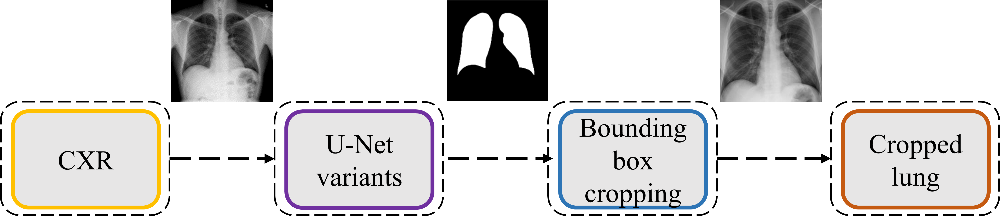

In [13]:
#this is the graphical abstract of the proposed study
from IPython.display import Image
Image("lung_segmentation.png", width = 700, height = 700)

In [ ]:
#load libraries
from __future__ import print_function

import keras
import tensorflow as tf
from keras.models import *
from keras.layers import *
from keras.metrics import *
from keras.layers.pooling import MaxPooling2D, GlobalAveragePooling2D, MaxPooling2D
import csv
import cv2
from keras.layers.core import Dense, Dropout, Activation
from keras.layers import BatchNormalization, Dropout, Flatten, Lambda
from keras.layers.advanced_activations import ELU, LeakyReLU
from keras.losses import binary_crossentropy
from keras.optimizers import *
from keras.preprocessing.image import ImageDataGenerator
from keras.regularizers import l2
from keras.layers.noise import GaussianDropout
import numpy as np
import tensorflow as tf
from sklearn.metrics import roc_auc_score
from sklearn.datasets import make_classification
from keras.models import Sequential
from keras.layers import Dense
from keras.utils import np_utils
from keras.callbacks import Callback, EarlyStopping
import numpy as np 
import os
import skimage.io as io
import extra_keras_metrics
from extra_keras_metrics import average_precision_at_k
from sklearn.metrics import average_precision_score
from skimage import img_as_ubyte, img_as_float
import skimage.transform as trans
from PIL import Image
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
import cv2 
import time
import os
import h5py
import matplotlib. pyplot as plt

from keras.models import Model
from keras.layers import Input, concatenate, Conv2D, MaxPooling2D, Conv2DTranspose, Activation
from keras.layers import BatchNormalization
from keras.optimizers import Adam
from keras import backend as K

from keras.models import Model
from keras.layers import Input, concatenate, Conv2D, MaxPooling2D, Conv2DTranspose
from keras.layers import Activation, add, multiply, Lambda
from keras.layers import AveragePooling2D, average, UpSampling2D, Dropout
from keras.optimizers import Adam, SGD, RMSprop
from keras.initializers import glorot_normal, random_normal, random_uniform
from keras.callbacks import ModelCheckpoint, TensorBoard, EarlyStopping

from keras import backend as K
from keras.layers.normalization import BatchNormalization 
from keras.applications import VGG19, densenet
from keras.models import load_model

import numpy as np
import tensorflow as tf 
import matplotlib.pyplot as plt 
from sklearn.metrics import roc_curve, auc, precision_recall_curve # roc curve tools
from sklearn.model_selection import train_test_split
from keras import backend as K
try:
    from itertools import izip as zip
except ImportError: # will be 3.x series
    pass

In [ ]:
#get current working directory
os.getcwd()

In [ ]:
#define loss and other functions
    
def accuracy(y_true, y_pred):
    return K.mean(K.equal(y_true, K.round(y_pred)), axis=-1)

def dice_coef(y_true, y_pred, smooth=1.):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (
                K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_loss(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = y_true_f * y_pred_f
    score = (2. * K.sum(intersection) + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return 1. - score

def bce_dice_loss(y_true, y_pred):
    return binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)

#this is done for one single thrteshold, say 0.5
def iou(y_true, y_pred, smooth=1.):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) - intersection + smooth)

def tversky(y_true, y_pred, smooth=1e-10):
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1-y_pred_pos))
    false_pos = K.sum((1-y_true_pos)*y_pred_pos)
    alpha = 0.7
    return (true_pos + smooth)/(true_pos + alpha*false_neg + (1-alpha)*false_pos + smooth)

def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true,y_pred)

def focal_tversky_loss(y_true,y_pred):
    pt_1 = tversky(y_true, y_pred)
    gamma = 0.75
    return K.pow((1-pt_1), gamma)

'''Mean Intersection-Over-Union is a common evaluation metric 
for semantic image segmentation, which first computes the IOU for 
each semantic class and then computes the average over classes. Here we compute 
this mean over a range of thresholds from 0.5 to 1.0 in the interval of 0.05'''


def mean_iou(y_true, y_pred):
    prec = []
    for t in np.arange(0.5, 1.0, 0.05):
        y_pred_ = tf.to_int32(y_pred > t)
        score, up_opt = tf.metrics.mean_iou(y_true, y_pred_, 2)
        K.get_session().run(tf.local_variables_initializer())
        with tf.control_dependencies([up_opt]):
            score = tf.identity(score)
        prec.append(score)
    return K.mean(K.stack(prec), axis=0)


Define model architecture

In [ ]:
#standard U-Net
smooth = 1.
dropout_rate = 0.2
def standard_unit(input_tensor, stage, nb_filter, kernel_size=3):
    act = 'relu'
    x = Conv2D(nb_filter, (kernel_size, kernel_size), activation=act, 
               name='conv'+stage+'_1', kernel_initializer = 'he_normal', 
               padding='same', kernel_regularizer=l2(1e-4))(input_tensor)
    x = Dropout(dropout_rate, name='dp'+stage+'_1')(x)
    x = Conv2D(nb_filter, (kernel_size, kernel_size), activation=act, 
               name='conv'+stage+'_2', kernel_initializer = 'he_normal', 
               padding='same', kernel_regularizer=l2(1e-4))(x)
    x = Dropout(dropout_rate, name='dp'+stage+'_2')(x)
    return x

"""
Standard U-Net [Ronneberger et.al, 2015]
Total params: 7,759,521
"""
def U_Net(img_rows, img_cols, color_type=1, num_class=1):

    nb_filter = [32,64,128,256,512]
    act = 'relu'
    bn_axis = 3 #channel_last
    img_input = Input(shape=(img_rows, img_cols, color_type), name='main_input')
    conv1_1 = standard_unit(img_input, stage='11', nb_filter=nb_filter[0])
    pool1 = MaxPooling2D((2, 2), strides=(2, 2), name='pool1')(conv1_1)

    conv2_1 = standard_unit(pool1, stage='21', nb_filter=nb_filter[1])
    pool2 = MaxPooling2D((2, 2), strides=(2, 2), name='pool2')(conv2_1)

    conv3_1 = standard_unit(pool2, stage='31', nb_filter=nb_filter[2])
    pool3 = MaxPooling2D((2, 2), strides=(2, 2), name='pool3')(conv3_1)

    conv4_1 = standard_unit(pool3, stage='41', nb_filter=nb_filter[3])
    pool4 = MaxPooling2D((2, 2), strides=(2, 2), name='pool4')(conv4_1)

    conv5_1 = standard_unit(pool4, stage='51', nb_filter=nb_filter[4])

    up4_2 = Conv2DTranspose(nb_filter[3], (2, 2), 
                            strides=(2, 2), name='up42', padding='same')(conv5_1)
    conv4_2 = concatenate([up4_2, conv4_1], name='merge42', axis=bn_axis)
    conv4_2 = standard_unit(conv4_2, stage='42', nb_filter=nb_filter[3])

    up3_3 = Conv2DTranspose(nb_filter[2], (2, 2), 
                            strides=(2, 2), name='up33', padding='same')(conv4_2)
    conv3_3 = concatenate([up3_3, conv3_1], name='merge33', axis=bn_axis)
    conv3_3 = standard_unit(conv3_3, stage='33', nb_filter=nb_filter[2])

    up2_4 = Conv2DTranspose(nb_filter[1], (2, 2), 
                            strides=(2, 2), name='up24', padding='same')(conv3_3)
    conv2_4 = concatenate([up2_4, conv2_1], name='merge24', axis=bn_axis)
    conv2_4 = standard_unit(conv2_4, stage='24', nb_filter=nb_filter[1])

    up1_5 = Conv2DTranspose(nb_filter[0], (2, 2), 
                            strides=(2, 2), name='up15', padding='same')(conv2_4)
    conv1_5 = concatenate([up1_5, conv1_1], name='merge15', axis=bn_axis)
    conv1_5 = standard_unit(conv1_5, stage='15', nb_filter=nb_filter[0])

    unet_output = Conv2D(num_class, (1, 1), activation='sigmoid', 
                         name='output', kernel_initializer = 'he_normal', 
                         padding='same', kernel_regularizer=l2(1e-4))(conv1_5)

    model = Model(inputs=img_input, outputs=unet_output)
    model.compile(optimizer = Adam(lr=1e-4), 
                  loss=tversky_loss,
                  metrics=["auprc", "auroc", iou, mean_iou, dice_coef, accuracy])
    
    return model

model = U_Net(256, 256, 1, 1)
model.summary()

In [ ]:
#V-Net with 5 residual blocks
#the vnet architecture comes from https://github.com/FENGShuanglang/2D-Vnet-Keras
#stage_num:allows you to change the stage of the network. 
#For example, the network model here is 5 stage. 
#You can set the stage_num=6 to make the network deeper into a stage. 
#The default parameter is 5


def resBlock(conv,stage,keep_prob,stage_num=3):
    
    inputs=conv
    
    for _ in range(3 if stage>3 else stage):
        conv=PReLU()(BatchNormalization()(Conv2D(16*(2**(stage-1)), 5, activation = None, 
                                                 padding = 'same', kernel_initializer = 'he_normal')(conv)))
        
    conv_add=PReLU()(add([inputs,conv]))
    conv_drop=Dropout(keep_prob)(conv_add)
    
    if stage<stage_num:
        conv_downsample=PReLU()(BatchNormalization()(Conv2D(16*(2**stage), 2, 
                                                            strides=(2, 2),activation = None, 
                                                            padding = 'same', kernel_initializer = 'he_normal')(conv_drop)))
        return conv_downsample,conv_add
    else:
        return conv_add,conv_add
        
def up_resBlock(forward_conv,input_conv,stage):
    
    conv=concatenate([forward_conv,input_conv],axis = -1)
    print('conv_concatenate:',conv.get_shape().as_list())
    for _ in range(3 if stage>3 else stage):
        conv=PReLU()(BatchNormalization()(Conv2D(16*(2**(stage-1)), 5, 
                                                 activation = None, padding = 'same', kernel_initializer = 'he_normal')(conv)))
        print('conv_up_stage_%d:' %stage,conv.get_shape().as_list())
    conv_add=PReLU()(add([input_conv,conv]))
    if stage>1:
        conv_upsample=PReLU()(BatchNormalization()(Conv2DTranspose(16*(2**(stage-2)),2,
                                                                   strides=(2, 2),padding='valid',
                                                                   activation = None,kernel_initializer = 'he_normal')(conv_add)))
        return conv_upsample
    else:
        return conv_add

def vnet(pretrained_weights = None,input_size = (256,256,1),num_class=1, #256,256,1
         is_training=True,stage_num=5,thresh=0.5):
    keep_prob = 1.0 if is_training else 1.0
    features=[]
    inputs = Input(input_size)
    x=PReLU()(BatchNormalization()(Conv2D(16, 5, activation = None, 
                                          padding = 'same', kernel_initializer = 'he_normal')(inputs)))
    
    for s in range(1,stage_num+1):
        x,feature=resBlock(x,s,keep_prob,stage_num)
        features.append(feature)
        
    conv_up=PReLU()(BatchNormalization()(Conv2DTranspose(16*(2**(s-2)),2,
                                                         strides=(2, 2),padding='valid',
                                                         activation = None,kernel_initializer = 'he_normal')(x)))
    
    for d in range(stage_num-1,0,-1):
        conv_up=up_resBlock(features[d-1],conv_up,d)
    if num_class>1:
        conv_out=Conv2D(num_class, 1, activation = 'softmax', padding = 'same', kernel_initializer = 'he_normal')(conv_up)
    else:
        conv_out=Conv2D(num_class, 1, activation = 'sigmoid', padding = 'same', kernel_initializer = 'he_normal')(conv_up)
    model=Model(inputs=inputs,outputs=conv_out)
    print(model.output_shape)
    model.compile(optimizer = Adam(lr=1e-4), 
                  loss=tversky_loss,
                  metrics=["auprc", "auroc", iou, mean_iou, dice_coef, accuracy])
    if(pretrained_weights):
        model.load_weights(pretrained_weights)
    return model

model = vnet()
model.summary()

In [ ]:
#improved atention U-Net
#from https://github.com/sivaramakrishnan-rajaraman/focal-tversky-unet/blob/master/newmodels.py

K.set_image_data_format('channels_last')  # TF dimension ordering in this code
kinit = 'glorot_normal'

def expend_as(tensor, rep,name):
    my_repeat = Lambda(lambda x, repnum: K.repeat_elements(x, repnum, axis=3), 
                       arguments={'repnum': rep},  name='psi_up'+name)(tensor)
    return my_repeat


def AttnGatingBlock(x, g, inter_shape, name):
    ''' take g which is the spatially smaller signal, do a conv to get the same
    number of feature channels as x (bigger spatially)
    do a conv on x to also get same geature channels (theta_x)
    then, upsample g to be same size as x 
    add x and g (concat_xg)
    relu, 1x1 conv, then sigmoid then upsample the final - this gives us attn coefficients'''
    
    shape_x = K.int_shape(x)  # 32
    shape_g = K.int_shape(g)  # 16

    theta_x = Conv2D(inter_shape, (2, 2), strides=(2, 2), padding='same', name='xl'+name)(x)  # 16
    shape_theta_x = K.int_shape(theta_x)

    phi_g = Conv2D(inter_shape, (1, 1), padding='same')(g)
    upsample_g = Conv2DTranspose(inter_shape, (3, 3),strides=(shape_theta_x[1] // shape_g[1], shape_theta_x[2] // shape_g[2]),padding='same', name='g_up'+name)(phi_g)  # 16

    concat_xg = add([upsample_g, theta_x])
    act_xg = Activation('relu')(concat_xg)
    psi = Conv2D(1, (1, 1), padding='same', name='psi'+name)(act_xg)
    sigmoid_xg = Activation('sigmoid')(psi)
    shape_sigmoid = K.int_shape(sigmoid_xg)
    upsample_psi = UpSampling2D(size=(shape_x[1] // shape_sigmoid[1], shape_x[2] // shape_sigmoid[2]))(sigmoid_xg)  # 32

    upsample_psi = expend_as(upsample_psi, shape_x[3],  name)
    y = multiply([upsample_psi, x], name='q_attn'+name)

    result = Conv2D(shape_x[3], (1, 1), padding='same',name='q_attn_conv'+name)(y)
    result_bn = BatchNormalization(name='q_attn_bn'+name)(result)
    return result_bn

def UnetConv2D(input, outdim, is_batchnorm, name):
    x = Conv2D(outdim, (3, 3), strides=(1, 1), kernel_initializer=kinit, padding="same", name=name+'_1')(input)
    if is_batchnorm:
        x =BatchNormalization(name=name + '_1_bn')(x)
    x = Activation('relu',name=name + '_1_act')(x)

    x = Conv2D(outdim, (3, 3), strides=(1, 1), kernel_initializer=kinit, padding="same", name=name+'_2')(x)
    if is_batchnorm:
        x = BatchNormalization(name=name + '_2_bn')(x)
    x = Activation('relu', name=name + '_2_act')(x)
    return x

def UnetGatingSignal(input, is_batchnorm, name):
    ''' this is simply 1x1 convolution, bn, activation '''
    shape = K.int_shape(input)
    x = Conv2D(shape[3] * 1, (1, 1), strides=(1, 1), padding="same",  kernel_initializer=kinit, name=name + '_conv')(input)
    if is_batchnorm:
        x = BatchNormalization(name=name + '_bn')(x)
    x = Activation('relu', name = name + '_act')(x)
    return x

def attn_reg(input_size, lossfxn, deep_supervision=False):
    
    img_input = Input(shape=input_size, name='input_scale1')
    scale_img_2 = AveragePooling2D(pool_size=(2, 2), name='input_scale2')(img_input)
    scale_img_3 = AveragePooling2D(pool_size=(2, 2), name='input_scale3')(scale_img_2)
    scale_img_4 = AveragePooling2D(pool_size=(2, 2), name='input_scale4')(scale_img_3)

    conv1 = UnetConv2D(img_input, 32, is_batchnorm=True, name='conv1')
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    
    input2 = Conv2D(64, (3, 3), padding='same', activation='relu', name='conv_scale2')(scale_img_2)
    input2 = concatenate([input2, pool1], axis=3)
    conv2 = UnetConv2D(input2, 64, is_batchnorm=True, name='conv2')
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    
    input3 = Conv2D(128, (3, 3), padding='same', activation='relu', name='conv_scale3')(scale_img_3)
    input3 = concatenate([input3, pool2], axis=3)
    conv3 = UnetConv2D(input3, 128, is_batchnorm=True, name='conv3')
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    
    input4 = Conv2D(256, (3, 3), padding='same', activation='relu', name='conv_scale4')(scale_img_4)
    input4 = concatenate([input4, pool3], axis=3)
    conv4 = UnetConv2D(input4, 64, is_batchnorm=True, name='conv4')
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)
        
    center = UnetConv2D(pool4, 512, is_batchnorm=True, name='center')
    
    g1 = UnetGatingSignal(center, is_batchnorm=True, name='g1')
    attn1 = AttnGatingBlock(conv4, g1, 128, '_1')
    up1 = concatenate([Conv2DTranspose(32, (3,3), strides=(2,2), padding='same', 
                                       activation='relu', kernel_initializer=kinit)(center), attn1], name='up1')

    g2 = UnetGatingSignal(up1, is_batchnorm=True, name='g2')
    attn2 = AttnGatingBlock(conv3, g2, 64, '_2')
    up2 = concatenate([Conv2DTranspose(64, (3,3), strides=(2,2), padding='same', 
                                       activation='relu', kernel_initializer=kinit)(up1), attn2], name='up2')

    g3 = UnetGatingSignal(up1, is_batchnorm=True, name='g3')
    attn3 = AttnGatingBlock(conv2, g3, 32, '_3')
    up3 = concatenate([Conv2DTranspose(32, (3,3), strides=(2,2), padding='same', 
                                       activation='relu', kernel_initializer=kinit)(up2), attn3], name='up3')

    up4 = concatenate([Conv2DTranspose(32, (3,3), strides=(2,2), padding='same', 
                                       activation='relu', kernel_initializer=kinit)(up3), conv1], name='up4')
    
    conv6 = UnetConv2D(up1, 256, is_batchnorm=True, name='conv6')
    conv7 = UnetConv2D(up2, 128, is_batchnorm=True, name='conv7')
    conv8 = UnetConv2D(up3, 64, is_batchnorm=True, name='conv8')
    conv9 = UnetConv2D(up4, 32, is_batchnorm=True, name='conv9')

    out6 = Conv2D(1, (1, 1), activation='sigmoid', name='pred1')(conv6)
    out7 = Conv2D(1, (1, 1), activation='sigmoid', name='pred2')(conv7)
    out8 = Conv2D(1, (1, 1), activation='sigmoid', name='pred3')(conv8)
    out9 = Conv2D(1, (1, 1), activation='sigmoid', name='final')(conv9)

    if deep_supervision:
        model = Model(inputs=[img_input], outputs=[out6, out7, out8, out9])
    else:
        model = Model(inputs=[img_input], outputs=[out9])
 
    #loss = {'pred1':lossfxn, 'pred2':lossfxn, 'pred3':lossfxn, 'final':lossfxn}    
    #loss_weights = {'pred1':1, 'pred2':1, 'pred3':1, 'final':1}
    loss = {'final':lossfxn}    
    loss_weights = {'final':1}
    
    model.compile(optimizer = Adam(lr=1e-4), 
                  loss=loss,
                  loss_weights=loss_weights,
                  metrics=["auprc", "auroc", iou, mean_iou, dice_coef, accuracy])
    return model 

model = attn_reg((256,256,1), tversky_loss, deep_supervision=False) 
model.summary()

In [ ]:
#vgg16 - imagenet model

def vgg16_unet(input_shape, vgg_weight_path=None):
    img_input = Input(input_shape)

    # Block 1
    x = Conv2D(64, (3, 3), padding='same', name='block1_conv1')(img_input)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(64, (3, 3), padding='same', name='block1_conv2')(x)
    x = BatchNormalization()(x)
    block_1_out = Activation('relu')(x)

    x = MaxPooling2D()(block_1_out)

    # Block 2
    x = Conv2D(128, (3, 3), padding='same', name='block2_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(128, (3, 3), padding='same', name='block2_conv2')(x)
    x = BatchNormalization()(x)
    block_2_out = Activation('relu')(x)

    x = MaxPooling2D()(block_2_out)

    # Block 3
    x = Conv2D(256, (3, 3), padding='same', name='block3_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(256, (3, 3), padding='same', name='block3_conv2')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(256, (3, 3), padding='same', name='block3_conv3')(x)
    x = BatchNormalization()(x)
    block_3_out = Activation('relu')(x)

    x = MaxPooling2D()(block_3_out)

    # Block 4
    x = Conv2D(512, (3, 3), padding='same', name='block4_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(512, (3, 3), padding='same', name='block4_conv2')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(512, (3, 3), padding='same', name='block4_conv3')(x)
    x = BatchNormalization()(x)
    block_4_out = Activation('relu')(x)

    x = MaxPooling2D()(block_4_out)

    # Block 5
    x = Conv2D(512, (3, 3), padding='same', name='block5_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(512, (3, 3), padding='same', name='block5_conv2')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(512, (3, 3), padding='same', name='block5_conv3')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    for_pretrained_weight = MaxPooling2D()(x)

    # Load pretrained weights.
    if vgg_weight_path is not None:
        vgg16 = Model(img_input, for_pretrained_weight)
        vgg16.load_weights(vgg_weight_path, by_name=True)

    # UP 1
    x = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, block_4_out])
    x = Conv2D(512, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(512, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # UP 2
    x = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, block_3_out])
    x = Conv2D(256, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(256, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # UP 3
    x = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, block_2_out])
    x = Conv2D(128, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(128, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # UP 4
    x = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, block_1_out])
    x = Conv2D(64, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(64, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # last conv
    x = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

    model = Model(img_input, x)
    model.compile(optimizer=Adam(lr=1e-4, decay=5e-4),
                  loss=tversky_loss,
                  metrics=["auprc", "auroc", iou, mean_iou, dice_coef, accuracy])
    return model


model = vgg16_unet((256,256,3), vgg_weight_path='vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5')
model.summary()

In [ ]:
#vgg-19 imagnet model
#for VGG-19 based encoder and U-Net model

def vgg19_unet(input_shape, vgg_weight_path=None):
    img_input = Input(input_shape)

    # Block 1
    x = Conv2D(64, (3, 3), padding='same', name='block1_conv1')(img_input)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(64, (3, 3), padding='same', name='block1_conv2')(x)
    x = BatchNormalization()(x)
    block_1_out = Activation('relu')(x)

    x = MaxPooling2D()(block_1_out)

    # Block 2
    x = Conv2D(128, (3, 3), padding='same', name='block2_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(128, (3, 3), padding='same', name='block2_conv2')(x)
    x = BatchNormalization()(x)
    block_2_out = Activation('relu')(x)

    x = MaxPooling2D()(block_2_out)

    # Block 3
    x = Conv2D(256, (3, 3), padding='same', name='block3_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(256, (3, 3), padding='same', name='block3_conv2')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    x = Conv2D(256, (3, 3), padding='same', name='block3_conv3')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(256, (3, 3), padding='same', name='block3_conv4')(x)
    x = BatchNormalization()(x)
    block_3_out = Activation('relu')(x)

    x = MaxPooling2D()(block_3_out)

    # Block 4
    x = Conv2D(512, (3, 3), padding='same', name='block4_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(512, (3, 3), padding='same', name='block4_conv2')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    x = Conv2D(512, (3, 3), padding='same', name='block4_conv3')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(512, (3, 3), padding='same', name='block4_conv4')(x)
    x = BatchNormalization()(x)
    block_4_out = Activation('relu')(x)

    x = MaxPooling2D()(block_4_out)

    # Block 5
    x = Conv2D(512, (3, 3), padding='same', name='block5_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(512, (3, 3), padding='same', name='block5_conv2')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    x = Conv2D(512, (3, 3), padding='same', name='block5_conv3')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(512, (3, 3), padding='same', name='block5_conv4')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    for_pretrained_weight = MaxPooling2D()(x)

    # Load pretrained weights.
    if vgg_weight_path is not None:
        vgg19 = Model(img_input, for_pretrained_weight)
        vgg19.load_weights(vgg_weight_path, by_name=True)

    # UP 1
    x = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, block_4_out])
    x = Conv2D(512, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    x = Conv2D(512, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # UP 2
    x = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, block_3_out])
    x = Conv2D(256, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    x = Conv2D(256, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # UP 3
    x = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, block_2_out])
    x = Conv2D(128, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(128, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # UP 4
    x = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, block_1_out])
    x = Conv2D(64, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(64, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # last conv
    x = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

    model = Model(img_input, x)
    model.compile(optimizer=Adam(lr=1e-4, decay=5e-4),
                  loss=tversky_loss,
                  metrics=["auprc", "auroc", iou, mean_iou, dice_coef, accuracy])
    return model


model = vgg19_unet((256,256,3), vgg_weight_path='vgg19_weights_tf_dim_ordering_tf_kernels_notop.h5')
model.summary()

In [ ]:
#vgg16 cxr import Model

def vgg16cxr_unet(input_shape, vgg_weight_path=None):
    img_input = Input(input_shape)

    # Block 1
    x = Conv2D(64, (3, 3), padding='same', name='block1_conv1')(img_input)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(64, (3, 3), padding='same', name='block1_conv2')(x)
    x = BatchNormalization()(x)
    block_1_out = Activation('relu')(x)

    x = MaxPooling2D()(block_1_out)

    # Block 2
    x = Conv2D(128, (3, 3), padding='same', name='block2_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(128, (3, 3), padding='same', name='block2_conv2')(x)
    x = BatchNormalization()(x)
    block_2_out = Activation('relu')(x)

    x = MaxPooling2D()(block_2_out)

    # Block 3
    x = Conv2D(256, (3, 3), padding='same', name='block3_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(256, (3, 3), padding='same', name='block3_conv2')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(256, (3, 3), padding='same', name='block3_conv3')(x)
    x = BatchNormalization()(x)
    block_3_out = Activation('relu')(x)

    x = MaxPooling2D()(block_3_out)

    # Block 4
    x = Conv2D(512, (3, 3), padding='same', name='block4_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(512, (3, 3), padding='same', name='block4_conv2')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(512, (3, 3), padding='same', name='block4_conv3')(x)
    x = BatchNormalization()(x)
    block_4_out = Activation('relu')(x)

    x = MaxPooling2D()(block_4_out)

    # Block 5
    x = Conv2D(512, (3, 3), padding='same', name='block5_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(512, (3, 3), padding='same', name='block5_conv2')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(512, (3, 3), padding='same', name='block5_conv3')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    for_pretrained_weight = MaxPooling2D()(x)

    # Load pretrained weights.
    if vgg_weight_path is not None:
        vgg16 = Model(img_input, for_pretrained_weight)
        vgg16.load_weights(vgg_weight_path, by_name=True)

    # UP 1
    x = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, block_4_out])
    x = Conv2D(512, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(512, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # UP 2
    x = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, block_3_out])
    x = Conv2D(256, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(256, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # UP 3
    x = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, block_2_out])
    x = Conv2D(128, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(128, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # UP 4
    x = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, block_1_out])
    x = Conv2D(64, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(64, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # last conv
    x = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

    model = Model(img_input, x)
    model.compile(optimizer=Adam(lr=1e-4, decay=5e-4),
                  loss=tversky_loss,
                  metrics=["auprc", "auroc", iou, mean_iou, dice_coef, accuracy])
    return model


model = vgg16cxr_unet((256,256,3), 
                      vgg_weight_path='vgg16_rsna_finetuned_customnature_data_imadjust_elasticdeform8_16_20.11-0.9231.h5')
model.summary()

In [ ]:
#vgg-19 CXR model

def vgg19cxr_unet(input_shape, vgg_weight_path=None):
    img_input = Input(input_shape)

    # Block 1
    x = Conv2D(64, (3, 3), padding='same', name='block1_conv1')(img_input)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(64, (3, 3), padding='same', name='block1_conv2')(x)
    x = BatchNormalization()(x)
    block_1_out = Activation('relu')(x)

    x = MaxPooling2D()(block_1_out)

    # Block 2
    x = Conv2D(128, (3, 3), padding='same', name='block2_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(128, (3, 3), padding='same', name='block2_conv2')(x)
    x = BatchNormalization()(x)
    block_2_out = Activation('relu')(x)

    x = MaxPooling2D()(block_2_out)

    # Block 3
    x = Conv2D(256, (3, 3), padding='same', name='block3_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(256, (3, 3), padding='same', name='block3_conv2')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    x = Conv2D(256, (3, 3), padding='same', name='block3_conv3')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(256, (3, 3), padding='same', name='block3_conv4')(x)
    x = BatchNormalization()(x)
    block_3_out = Activation('relu')(x)

    x = MaxPooling2D()(block_3_out)

    # Block 4
    x = Conv2D(512, (3, 3), padding='same', name='block4_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(512, (3, 3), padding='same', name='block4_conv2')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    x = Conv2D(512, (3, 3), padding='same', name='block4_conv3')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(512, (3, 3), padding='same', name='block4_conv4')(x)
    x = BatchNormalization()(x)
    block_4_out = Activation('relu')(x)

    x = MaxPooling2D()(block_4_out)

    # Block 5
    x = Conv2D(512, (3, 3), padding='same', name='block5_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(512, (3, 3), padding='same', name='block5_conv2')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    x = Conv2D(512, (3, 3), padding='same', name='block5_conv3')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(512, (3, 3), padding='same', name='block5_conv4')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    for_pretrained_weight = MaxPooling2D()(x)

    # Load pretrained weights.
    if vgg_weight_path is not None:
        vgg19 = Model(img_input, for_pretrained_weight)
        vgg19.load_weights(vgg_weight_path, by_name=True)

    # UP 1
    x = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, block_4_out])
    x = Conv2D(512, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    x = Conv2D(512, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # UP 2
    x = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, block_3_out])
    x = Conv2D(256, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    x = Conv2D(256, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # UP 3
    x = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, block_2_out])
    x = Conv2D(128, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(128, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # UP 4
    x = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, block_1_out])
    x = Conv2D(64, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(64, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # last conv
    x = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

    model = Model(img_input, x)
    model.compile(optimizer=Adam(lr=1e-4, decay=5e-4),
                  loss=tversky_loss,
                  metrics=["auprc", "auroc", iou, mean_iou, dice_coef, accuracy])
    return model


model = vgg19cxr_unet((256,256,3), 
                      vgg_weight_path='vgg19_rsna_inetuned_customnature_data_imadjust_elasticdeform8_16_20.04-0.9158.h5')
model.summary()

In [ ]:
#data format for grayscale images
#issue based on https://github.com/zhixuhao/unet/issues/125
from skimage import img_as_ubyte

Sky = [128,128,128]
Building = [128,0,0]
Pole = [192,192,128]
Road = [128,64,128]
Pavement = [60,40,222]
Tree = [128,128,0]
SignSymbol = [192,128,128]
Fence = [64,64,128]
Car = [64,0,128]
Pedestrian = [64,64,0]
Bicyclist = [0,128,192]
Unlabelled = [0,0,0]

COLOR_DICT = np.array([Sky, Building, Pole, Road, Pavement,
                          Tree, SignSymbol, Fence, Car, Pedestrian, Bicyclist, Unlabelled])


def adjustData(img,mask,flag_multi_class,num_class):
    if(flag_multi_class):
        img = img / 255
        mask = mask[:,:,:,0] if(len(mask.shape) == 4) else mask[:,:,0]
        new_mask = np.zeros(mask.shape + (num_class,))
        for i in range(num_class):
            new_mask[mask == i,i] = 1
        new_mask = np.reshape(new_mask,(new_mask.shape[0],new_mask.shape[1]*new_mask.shape[2],new_mask.shape[3])) if flag_multi_class else np.reshape(new_mask,(new_mask.shape[0]*new_mask.shape[1],new_mask.shape[2]))
        mask = new_mask
    elif(np.max(img) > 1):
        img = img / 255
        mask = mask /255
        mask[mask > 0.5] = 1
        mask[mask <= 0.5] = 0
    return (img,mask)


def trainGenerator(batch_size,train_path,image_folder,mask_folder,aug_dict,image_color_mode = "grayscale",
                    mask_color_mode = "grayscale",image_save_prefix  = "image",mask_save_prefix  = "mask",
                    flag_multi_class = False,num_class = 2,save_to_dir = None,target_size = (256,256),seed = 1): #256,256

    image_datagen = ImageDataGenerator(**aug_dict)
    mask_datagen = ImageDataGenerator(**aug_dict)
    image_generator = image_datagen.flow_from_directory(
        train_path,
        classes = [image_folder],
        class_mode = None,
        color_mode = image_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = image_save_prefix,
        seed = seed)
    mask_generator = mask_datagen.flow_from_directory(
        train_path,
        classes = [mask_folder],
        class_mode = None,
        color_mode = mask_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = mask_save_prefix,
        seed = seed)
    train_generator = zip(image_generator, mask_generator)
    for (img,mask) in train_generator:
        img,mask = adjustData(img,mask,flag_multi_class,num_class)
        yield (img,mask)

def valGenerator(batch_size,val_path,image_folder,mask_folder,aug_dict,image_color_mode = "grayscale",
                    mask_color_mode = "grayscale",image_save_prefix  = "image",mask_save_prefix  = "mask",
                    flag_multi_class = False,num_class = 2,save_to_dir = None,target_size = (256,256),seed = 1): #256,256

    image_datagen = ImageDataGenerator()
    mask_datagen = ImageDataGenerator()
    image_generator = image_datagen.flow_from_directory(
        val_path,
        classes = [image_folder],
        class_mode = None,
        color_mode = image_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = image_save_prefix,
        seed = seed)
    mask_generator = mask_datagen.flow_from_directory(
        val_path,
        classes = [mask_folder],
        class_mode = None,
        color_mode = mask_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = mask_save_prefix,
        seed = seed)
    val_generator = zip(image_generator, mask_generator)
    for (img,mask) in val_generator:
        img,mask = adjustData(img,mask,flag_multi_class,num_class)
        yield (img,mask)
        
def testGenerator(test_path,target_size = (256,256),flag_multi_class = False,as_gray = True): #256,256
    for filename in os.listdir(test_path):
        img = io.imread(os.path.join(test_path,filename),as_gray = as_gray) 
        img = img / 255.
        img = trans.resize(img,target_size)
        img = np.reshape(img,img.shape+(1,)) if (not flag_multi_class) else img
        img = np.reshape(img,(1,)+img.shape)
        yield img


def labelVisualize(num_class,color_dict,img):
    img = img[:,:,0] if len(img.shape) == 3 else img
    img_out = np.zeros(img.shape + (3,))
    for i in range(num_class):
        img_out[img == i,:] = color_dict[i]
    return img_out / 255


def saveResult(save_path,npyfile,test_path, flag_multi_class = False,num_class = 2):
    file_names = os.listdir(test_path)
    for i,item in enumerate(npyfile):
        img = labelVisualize(num_class,COLOR_DICT,item) if flag_multi_class else item[:,:,0]
        io.imsave(os.path.join(save_path,file_names[i]),img)
        #io.imsave(os.path.join(save_path,file_names[i]),img_as_float(img))
        

In [ ]:
# method to train a particular model

model = U_Net(256, 256, 1, 1)
model.summary()
epochs = 128
data_gen_args = dict(rotation_range=0.2,
                    width_shift_range=0.05,
                    height_shift_range=0.05,
                    shear_range=0.05,
                    zoom_range=0.05,
                    horizontal_flip=True,
                    fill_mode='nearest')
myGene = trainGenerator(2,'data/membrane/train',
                        'image','label', data_gen_args,save_to_dir = None) #batch size = 2 here
valGene = valGenerator(2,'data/membrane/test',
                       'image','label', data_gen_args,save_to_dir = None) #batch size = 2 here

callbacks = [EarlyStopping(monitor='val_loss', patience=10, verbose=1, min_delta=1e-4, #val_loss before
                           mode='min'),
             ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1,
                               min_delta=1e-4, mode='min'),
             ModelCheckpoint(monitor='val_loss', filepath='trained_model/unet.hdf5', 
                             save_best_only=True, mode='min', verbose = 1)] 

history = model.fit_generator(generator=myGene,steps_per_epoch=550, epochs=epochs, callbacks=callbacks, 
                    validation_data=valGene, validation_steps=28, verbose=1)

In [ ]:
#for RGB images
from skimage import img_as_ubyte

Sky = [128,128,128]
Building = [128,0,0]
Pole = [192,192,128]
Road = [128,64,128]
Pavement = [60,40,222]
Tree = [128,128,0]
SignSymbol = [192,128,128]
Fence = [64,64,128]
Car = [64,0,128]
Pedestrian = [64,64,0]
Bicyclist = [0,128,192]
Unlabelled = [0,0,0]

COLOR_DICT = np.array([Sky, Building, Pole, Road, Pavement,
                          Tree, SignSymbol, Fence, Car, Pedestrian, Bicyclist, Unlabelled])


def adjustData(img,mask,flag_multi_class,num_class):
    if(flag_multi_class):
        img = img / 255
        mask = mask[:,:,:,0] if(len(mask.shape) == 4) else mask[:,:,0]
        new_mask = np.zeros(mask.shape + (num_class,))
        for i in range(num_class):
            new_mask[mask == i,i] = 1
        new_mask = np.reshape(new_mask,(new_mask.shape[0],
                                        new_mask.shape[1]*new_mask.shape[2],
                                        new_mask.shape[3])) if flag_multi_class else np.reshape(new_mask,(new_mask.shape[0]*new_mask.shape[1],new_mask.shape[2]))
        mask = new_mask
    elif(np.max(img) > 1):
        img = img / 255
        mask = mask /255
        mask[mask > 0.5] = 1
        mask[mask <= 0.5] = 0
    return (img,mask)


def trainGenerator(batch_size,train_path,image_folder,mask_folder,aug_dict,image_color_mode = "rgb",
                    mask_color_mode = "rgb",image_save_prefix  = "image",mask_save_prefix  = "mask",
                    flag_multi_class = False,num_class = 2,save_to_dir = None,target_size = (256, 256),seed = 1): 

    image_datagen = ImageDataGenerator(**aug_dict)
    mask_datagen = ImageDataGenerator(**aug_dict)
    image_generator = image_datagen.flow_from_directory(
        train_path,
        classes = [image_folder],
        class_mode = None,
        color_mode = image_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = image_save_prefix,
        seed = seed)
    mask_generator = mask_datagen.flow_from_directory(
        train_path,
        classes = [mask_folder],
        class_mode = None,
        color_mode = mask_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = mask_save_prefix,
        seed = seed)
    train_generator = zip(image_generator, mask_generator)
    for (img,mask) in train_generator:
        img,mask = adjustData(img,mask,flag_multi_class,num_class)
        yield (img,mask)
        
def valGenerator(batch_size,val_path,image_folder,mask_folder,aug_dict,image_color_mode = "rgb",
                    mask_color_mode = "rgb",image_save_prefix  = "image",mask_save_prefix  = "mask",
                    flag_multi_class = False,num_class = 2,save_to_dir = None,target_size = (256,256),seed = 1): 

    image_datagen = ImageDataGenerator()
    mask_datagen = ImageDataGenerator()
    image_generator = image_datagen.flow_from_directory(
        val_path,
        classes = [image_folder],
        class_mode = None,
        color_mode = image_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = image_save_prefix,
        seed = seed)
    mask_generator = mask_datagen.flow_from_directory(
        val_path,
        classes = [mask_folder],
        class_mode = None,
        color_mode = mask_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = mask_save_prefix,
        seed = seed)
    val_generator = zip(image_generator, mask_generator)
    for (img,mask) in val_generator:
        img,mask = adjustData(img,mask,flag_multi_class,num_class)
        yield (img,mask)
        
def testGenerator(test_path,target_size = (256,256),flag_multi_class = True,as_gray = False): #256,256
    for filename in os.listdir(test_path):
        img = io.imread(os.path.join(test_path,filename),as_gray = as_gray) 
        img = img / 255.
        #img = trans.resize(img,target_size)
        img = np.reshape(img,img.shape+(1,)) if (not flag_multi_class) else img
        img = np.reshape(img,(1,)+img.shape)
        yield img


def labelVisualize(num_class,color_dict,img):
    img = img[:,:,0] if len(img.shape) == 3 else img
    img_out = np.zeros(img.shape + (3,))
    for i in range(num_class):
        img_out[img == i,:] = color_dict[i]
    return img_out / 255


def saveResult(save_path,npyfile,test_path, flag_multi_class = False,num_class = 2):
    file_names = os.listdir(test_path)
    for i,item in enumerate(npyfile):
        img = labelVisualize(num_class,COLOR_DICT,item) if flag_multi_class else item[:,:,0]
        io.imsave(os.path.join(save_path,file_names[i]),img)
        

In [ ]:
#for training a model with rgb images

model = vgg16_unet((256,256,3), 
                   vgg_weight_path='vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5')
epochs = 128

data_gen_args = dict(rotation_range=0.2,
                    width_shift_range=0.05,
                    height_shift_range=0.05,
                    shear_range=0.05,
                    zoom_range=0.05,
                    horizontal_flip=True,
                    fill_mode='nearest')
myGene = trainGenerator(2,'data/membrane/train_3channel',
                        'image','label', data_gen_args,save_to_dir = None) #batch size = 2 here
valGene = valGenerator(2,'data/membrane/test_3channel',
                       'image','label', data_gen_args,save_to_dir = None) #batch size = 2 here

callbacks = [EarlyStopping(monitor='val_loss', patience=10, verbose=1, min_delta=1e-4, #val_loss before
                           mode='min'),
             ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1,
                               min_delta=1e-4, mode='min'),
             ModelCheckpoint(monitor='val_loss', filepath='trained_model/unetrgb.hdf5', 
                             save_best_only=True, mode='min', verbose = 1)] 

history = model.fit_generator(generator=myGene,steps_per_epoch=550, epochs=epochs, callbacks=callbacks, 
                    validation_data=valGene, validation_steps=28, verbose=1)


In [ ]:
#prediction time 
#for lung segmentation, the same logic for TB segmentation
test_path = "C:/Users/image" 
save_path = "C:/Users/predicted" 
   

data_gen_args = dict(rotation_range=0.2,
                    width_shift_range=0.05,
                    height_shift_range=0.05,
                    shear_range=0.05,
                    zoom_range=0.05,
                    horizontal_flip=True,
                    fill_mode='nearest')

testGene = testGenerator(test_path) #for grayscale images
#testGene = testGenerator(test_path, flag_multi_class=True, as_gray=False) #for RGB images
model = attn_reg((256,256,1), tversky_loss, deep_supervision=False) 
model.load_weights("trained_model/improvedunet.hdf5")
model.summary()
results = model.predict_generator(testGene,58,verbose=1, workers=1, use_multiprocessing=False) 
saveResult(save_path, results, test_path)

After predicitng the masks, do postprocessing to overlay the mask and crop the image to a bounding box, also resize the disease specific ROI bounding box coordnates following lung cropping. Repeat the same process when doing TB segmentation at a later point in stage.

In [ ]:
# postprocessing with the mask and image: 
#This script helps to postprocess the images with the mask generated through 
#the UNET and relax the boundaries by 5% on top, bottom, left, and right, and store 
#the bounding box cordinates to a csv file. The cropped bounding box images are stored to a directory.
# the original GT disease annotations, if available, will also be rescaled and stored to
# a separate CSV file.
#the source CSV file in organized as follows:
#filename, x, y, width, height, target, class: x, y denote the top left
#filename should not have .png extension or any other image extension, this cide assumes use of png files
#target: 1 or 0 based on your labels; class: TB/COVID-19 or others

def generate_bounding_box(image_dir: str,
                          mask_dir: str,
                          orgin_csv: str,
                          dest_csv: str,
                          crop_save_dir: str,
                          show_results: bool=False):
    if not os.path.isdir(mask_dir):
        raise ValueError("mask_dir not existed")

    csv_file_data = []
    with open(orgin_csv, 'r') as csvFile:
        reader = csv.reader(csvFile)
        for row in reader:
            csv_file_data.append(row)

    with open(dest_csv, 'w', newline='') as f:
        csv_writer = csv.writer(f)

        for j, row in enumerate(csv_file_data[1:]):
            case_name = row[0] + '.png' #all mask files are png file type            
            mask = cv2.imread(mask_dir + case_name)
            mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
            image = cv2.imread(image_dir + case_name, cv2.COLOR_BGR2GRAY)
            #original images are resized to 256x256, 
            #comment this if you want to keep the original image resolution
            image = cv2.resize(image,(256,256)) 
            if mask is None or image is None:
                #raise ValueError("The image can not be read: " + case_name)
                cv2.imwrite(crop_save_dir + case_name, image) 
            
            reduce_col = np.sum(mask, axis=1)
            reduce_row = np.sum(mask, axis=0)
            # many 0s add up to none zero, we need to threshold it
            reduce_col = (reduce_col >= 255)*reduce_col
            reduce_row = (reduce_row >= 255)*reduce_row
            first_none_zero = None
            last_none_zero = None

            last = 0
            for i in range(reduce_col.shape[0]):
                current = reduce_col[i]
                if last == 0 and current != 0 and first_none_zero is None:
                    first_none_zero = i

                if current != 0:
                    last_none_zero = i

                last = reduce_col[i]

            up = first_none_zero
            down = last_none_zero

            first_none_zero = None
            last_none_zero = None
            last = 0
            for i in range(reduce_row.shape[0]):
                current = reduce_row[i]
                if last == 0 and current != 0 and first_none_zero is None:
                    first_none_zero = i

                if current != 0:
                    last_none_zero = i

                last = reduce_row[i]

            left = first_none_zero
            right = last_none_zero
            
            if up is None or down is None or left is None or right is None:
                raise ValueError("The border is not found: " + case_name)
            
            # new coordinates for image which is 1 times of mask, mask images are 256x256, 
            #need to multiply 1 times to get 256x256, and relaxing the borders by 5% on all directions
            # for example, if the original image resolution is 
            #1024x1024, new coordinates for image is 4 times of mask (256x256), 
            #need to multiply 4 times to 1024x1024, and relaxing the borders by 5% on all directions, 
            #i.e. int(4 * (down - up + 1) * 0.05)
            
            loose = int(1 * (down - up + 1) * 0.05) 
            
            image_up = 1 * up - loose #4
            if image_up < 0:
                image_up = 0
            image_down = 1*(down+1)+loose #4
            if image_down > image.shape[0] + 1:
                image_down = image.shape[0]

            loose2 = int(1 * (right - left + 1) * 0.05) #4
            image_left = 1 * left - loose2 #4
            if image_left < 0:
                image_left = 0
            image_right = 1*(right+1)+loose2 #4
            if image_right > image.shape[1] + 1:
                image_right = image.shape[1]

            crop = image[image_up: image_down, image_left: image_right]
            crop = cv2.resize(crop, (256,256)) #1024, 1024 
            cv2.imwrite(crop_save_dir + case_name, crop)

            # write to new csv
            crop_width = image_right - image_left + 1
            crop_height = image_down - image_up + 1

            if row[6] == "TB":

                y_scale_change = 256 / crop_height #1024 
                x_scale_change = 256 / crop_width # 1024 
                bbox_y = int(float(row[2])) 
                #new_y = int((bbox_y - image_up) * y_scale_change) #if the annotations are available for 256 x 256 image
                new_y = int((bbox_y/4 - image_up) * y_scale_change) #since resized to 256 from 1024, scale by 1/4

                bbox_x = int(float(row[1]))
                #new_x = int((bbox_x - image_left) * x_scale_change)#if the annotations are available for 256 x 256 image
                new_x = int((bbox_x/4 - image_left) * x_scale_change)  #since resized to 256 from 1024, scale by 1/4

                bbox_width = int(float(row[3]))
                bbox_height = int(float(row[4]))
                #new_width = int(bbox_width * x_scale_change)  #if the annotations are available for 256 x 256 image
                #new_height = int(bbox_height * y_scale_change) #if the annotations are available for 256 x 256 image
                new_width = int(bbox_width/4 * x_scale_change)  #since resized to 256 from 1024, scale by 1/4
                new_height = int(bbox_height/4 * y_scale_change) #since resized to 256 from 1024, scale by 1/4

                csv_writer.writerow([case_name,
                                     image_left,
                                     image_up,
                                     crop_width,
                                     crop_height,
                                     new_x,
                                     new_y,
                                     new_width,
                                     new_height,
                                     row[6]])

            else:
                csv_writer.writerow([case_name,
                                     image_left,
                                     image_up,
                                     crop_width,
                                     crop_height,
                                     "",
                                     "",
                                     "",
                                     "",
                                     row[6]])
            
            if j % 100 == 0:
                print(j, " images are processed!")

#usage:
generate_bounding_box('C:/Users/rajaramans2/codes/montgomery_roi_1024/',
                      'C:/Users/rajaramans2/codes/montgomery_roi_1024_mask/',
                      'C:/Users/rajaramans2/codes/segmentation.csv',
                      'C:/Users/rajaramans2/codes/resizedroi_lungsegmentation.csv',
                      'C:/Users/rajaramans2/codes/cropped_image/',
                      show_results=False)

In [ ]:
#%% #compute confusion matrix

'''
If your masks have only one channel and in the case of binary segmentation, 
you can easily compute a confusion matrix from one image thanks to:

    TP: ground truth and predicted pixel are of class 1 (object)
    TN: ground truth and predicted pixel are of class 0 (background)
    FP: ground truth pixel=0 while predicted pixel=1
    FN: ground truth pixel=1 while predicted pixel=0

On a dataset, you can get the confusion matrix from chosen iou thresholds. 
For example if your iou threshold is 0.5:

    TP += 1 for each image where iou(ground_truth, predicted) >= 0.5
    FP += 1 for each image where iou(ground_truth, predicted) < 0.5 and predicted != empty
    FN += 1 for each image where iou(ground_truth, predicted) < 0.5 and gt != empty
    TN += 1 for each image where both predicted and  gt masks are empty

if a is predicted and b is ground truth mask
if a[j] == 255 and b[j] == 255:
            tp+=1
        if a[j] == 0 and b[j] == 255:
            fn+=1
        if a[j] == 0 and b[j] == 0:
            tn+=1
        if a[j] == 255 and b[j] == 0:
            fp+=1
'''

def confusion_mat():
    #vars
    tp, fn, tn, fp = 0,0,0,0
    #mask_path = r'data/test_masks/' #ground truth
    #pred_path = r'data/test/test_outs/' #predicted masks
    mask_path = r'img/gt/' #ground truth
    pred_path = r'img/predicted/' #predicted masks
   
    a = np.array([])
    b = np.array([])
  
    #read predicts and flat
    for filename in os.listdir(pred_path):
        if filename.endswith('.png'):
            img = cv2.imread(pred_path+filename,0)
            flat_img = img.reshape(-1)
            #fix non binary pixels
            for i in range(len(flat_img)):
                if flat_img[i] >0:
                    flat_img[i] = 255
                else:
                    flat_img[i] = 0
            a = np.concatenate([a, flat_img])
    #print(a.shape)
      
    #read true masks and flat
    for filename in os.listdir(mask_path):
        if filename.endswith('.png'):
            mask = cv2.imread(mask_path+filename,0)
            flat_mask = mask.reshape(-1)
        b = np.concatenate([b,flat_mask])
    #print(b.shape)



    #create confusion mat
    for j in range(len(a)):#or len(flat_mask)
        if a[j] == 255 and b[j] == 255:
            tp+=1
        if a[j] == 0 and b[j] == 255:
            fn+=1
        if a[j] == 0 and b[j] == 0:
            tn+=1
        if a[j] == 255 and b[j] == 0:
            fp+=1
    #calculate acc
    print('The true positives are given by TP = ', tp)
    print('The false negatives are given by FN = ', fn)
    print('The false positives are given by FP = ', fp)
    print('The true negatives are given by TN = ', tn)
    
    acc = (tp+tn)/(tp+tn+fp+fn)
    print(acc*100)

confusion_mat()

In [ ]:
#plot confusion matrix
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Paired):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    title_font = {'fontname':'Arial', 'size':'30', 'color':'black', 
                  'weight':'normal', 'verticalalignment':'bottom'} 
    axis_font = {'fontname':'Arial', 'size':'20'}
    #plt.title(title, **title_font)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, fontsize=20, rotation=0)
    plt.yticks(tick_marks, classes, fontsize=20, rotation=0)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
    print(cm)
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j], fontsize=30,
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label', **axis_font)
    plt.xlabel('Predicted label', **axis_font)   

In [ ]:
import itertools

target_names = ['TB','Background'] 
# enter confusion matrix values
my_list = [[168457,182151],[184578,3315928]] 
cnf_matrix = np.array(my_list)
print(cnf_matrix)

# Plot non-normalized confusion matrix using scikit learn
plt.figure(figsize=(10,10), dpi=400)
plot_confusion_matrix(cnf_matrix, classes=target_names)
plt.savefig("confmat.png")
plt.show()

In [ ]:
#Plot AUC curves using the ground truth and predicted masks

#load libraries
import glob
import cv2
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt


class CollectData:
    def __init__(self):
        self.TP = []
        self.FP = []
        self.FN = []
        self.TN = []

    def reload(self,groundtruth,probgraph):
        """

        :param groundtruth:  list,groundtruth image list
        :param probgraph:    list,prob image list
        :return:  None
        """
        self.groundtruth = groundtruth
        self.probgraph = probgraph
        self.TP = []
        self.FP = []
        self.FN = []
        self.TN = []
    
    def IoU(self,threshold=128):
        """
        to calculate IoU
        :param threshold: numerical,a threshold for gray image to binary image
        :return:  IoU
        """
        intersection=0.0
        union=0.0

        for index in range(len(self.groundtruth)):
            gt_img = cv2.imread(self.groundtruth[index])[:, :, 0]
            prob_img = cv2.imread(self.probgraph[index])[:, :, 0]

            gt_img = (gt_img > 0) * 1
            prob_img = (prob_img >= threshold) * 1

            intersection=intersection+np.sum(gt_img*prob_img)
            union=union+np.sum(gt_img)+np.sum(prob_img)-np.sum(gt_img*prob_img)
        iou=np.round(intersection/union,4)
        return iou

    def statistics(self):
        """
        calculate FPR TPR Precision Recall IoU
        :return: (FPR,TPR,AUC),(Precision,Recall,MAP),IoU
        """
        for threshold in tqdm(range(0,255)):
            temp_TP=0.0
            temp_FP=0.0
            temp_FN=0.0
            temp_TN=0.0
            assert(len(self.groundtruth)==len(self.probgraph))

            for index in range(len(self.groundtruth)):
                gt_img=cv2.imread(self.groundtruth[index])[:,:,0]
                prob_img=cv2.imread(self.probgraph[index])[:,:,0]

                gt_img=(gt_img>0)*1
                prob_img=(prob_img>=threshold)*1

                temp_TP = temp_TP + (np.sum(prob_img * gt_img))
                temp_FP = temp_FP + np.sum(prob_img * ((1 - gt_img)))
                temp_FN = temp_FN + np.sum(((1 - prob_img)) * ((gt_img)))
                temp_TN = temp_TN + np.sum(((1 - prob_img)) * (1 - gt_img))

            self.TP.append(temp_TP)
            self.FP.append(temp_FP)
            self.FN.append(temp_FN)
            self.TN.append(temp_TN)

        self.TP = np.asarray(self.TP).astype('float32')
        self.FP = np.asarray(self.FP).astype('float32')
        self.FN = np.asarray(self.FN).astype('float32')
        self.TN = np.asarray(self.TN).astype('float32')

        FPR = (self.FP) / (self.FP + self.TN)
        TPR = (self.TP) / (self.TP + self.FN)
        AUC = np.round(np.sum((TPR[1:] + TPR[:-1]) * (FPR[:-1] - FPR[1:])) / 2., 4)

        Precision = (self.TP) / (self.TP + self.FP)
        Recall = self.TP / (self.TP + self.FN)
        MAP = np.round(np.sum((Precision[1:] + Precision[:-1]) * (Recall[:-1] - Recall[1:])) / 2.,4) #mpdify to + and see the result

        iou=self.IoU()

        return (FPR,TPR,AUC),(Precision,Recall,MAP),iou    

    def debug(self):
        """
        show debug info
        :return: None
        """
        print("Now enter debug mode....\nPlease check the info bellow:")
        print("total groundtruth: %d   total probgraph: %d\n"%(len(self.groundtruth),len(self.probgraph)))
        for index in range(len(self.groundtruth)):
            print(self.groundtruth[index],self.probgraph[index])
        print("Please confirm the groundtruth and probgraph name is opposite")


class DrawCurve:
    """
    draw ROC/PR curve
    """
    def __init__(self,savepath):
        self.savepath=savepath
        self.colorbar=['blue','red','green','black']
        self.linestyle=['-','-.','--','--',':','-*']

    def reload(self,xdata,ydata,auc,dataName,modelName):
        """
        this function is to update data for Function roc/pr to draw
        :param xdata:  list,x-coord of roc(pr)
        :param ydata:  list,y-coord of roc(pr)
        :param auc:    numerical,area under curve
        :param dataName: string,name of dataset
        :param modelName: string,name of test model
        :return:  None
        """
        self.xdata.append(xdata)
        self.ydata.append(ydata)
        self.modelName.append(modelName)
        self.auc.append(auc)
        self.dataName=dataName

    def newly(self,modelnum):
        """
        renew all the data
        :param modelnum:  numerical,number of models to draw
        :return:  None
        """
        self.modelnum = modelnum
        self.xdata = []
        self.ydata = []
        self.modelName = []
        self.auc = []

    def roc(self):
        """
        draw ROC curve,save the curve graph to  savepath
        :return: None
        """
        plt.figure(1)
        #plt.title('ROC Curve of %s'%self.dataName, fontsize=15)
        plt.xlabel("False Positive Rate", fontsize=15)
        plt.ylabel("True Positive Rate", fontsize=15)
        plt.xlim(0, 1)
        plt.ylim(0, 1)
        plt.xticks(fontsize=12)
        plt.yticks(fontsize=12)
        for i in range(self.modelnum):
            plt.plot(self.xdata[i], self.ydata[i], color=self.colorbar[i%len(self.colorbar)], 
                     linewidth=2.0, linestyle=self.linestyle[i%len(self.linestyle)], 
                     label=self.modelName[i]+',AUC:' + str(self.auc[i]))
        plt.legend()
        plt.savefig(self.savepath+'%s_ROC.png'%self.dataName, dpi=800)
        #plt.show()


    def pr(self):
        """
        draw PR curve,save the curve to  savepath
        :return: None
        """
        plt.figure(2)
        #plt.title('PR Curve of %s'%self.dataName, fontsize=15)
        plt.xlabel("Recall", fontsize=15)
        plt.ylabel("Precision", fontsize=15)
        plt.xlim(0, 1)
        plt.ylim(0, 1)
        plt.xticks(fontsize=12)
        plt.yticks(fontsize=12)
        for i in range(self.modelnum):
            plt.plot(self.xdata[i], self.ydata[i], color=self.colorbar[i%len(self.colorbar)], 
                     linewidth=2.0, linestyle=self.linestyle[i%len(self.linestyle)],
                     label=self.modelName[i]+',MAP:' + str(self.auc[i]))
        plt.legend()
        plt.savefig(self.savepath+'%s_PR.png'%self.dataName, dpi=800)
        #plt.show()


def fileList(imgpath,filetype):
    return glob.glob(imgpath+filetype)


def drawCurve(gtlist,problist,modelName,dataset,savepath='./'):
    """
    draw ROC PR curve,calculate AUC MAP IoU
    :param gtlist:  list,groundtruth list
    :param problist: list,list of probgraph list
    :param modelName:  list,name of test,model
    :param dataset: string,name of dataset
    :param savepath: string,path to save curve
    :return:
    """
    assert(len(problist)==len(modelName))

    process = CollectData()
    painter_roc = DrawCurve(savepath)
    painter_pr = DrawCurve(savepath)
    modelNum=len(problist)
    painter_roc.newly(modelNum)
    painter_pr.newly(modelNum)

    # calculate param
    for index in range(modelNum):
        process.reload(gtlist,problist[index])
        (FPR, TPR, AUC), (Precision, Recall, MAP),IoU = process.statistics()
        painter_roc.reload(FPR, TPR, AUC,dataset, modelName[index])
        painter_pr.reload(Precision, Recall, MAP, dataset, modelName[index])

    # draw curve and save
    painter_roc.roc()
    painter_pr.pr()
    
if __name__=="__main__":
    gtlist = fileList('gt/', '*.png') #ground truth masks
    cnnproblist = fileList('predicted/', '*.png') #predicted masks
    modelName=['Model-1']
    drawCurve(gtlist,[cnnproblist],modelName,'Model-1 performance')

### Modality specific pretraining: The first step in repeated CXR_specific pretraining is to train the models on a large scale selection of CXRs to clasify them into normal and abnormal classes.


In [ ]:
#%% load libraries; clear current gpu session
import warnings 
warnings.filterwarnings('ignore',category=FutureWarning) #because of numpy version
import tensorflow as tf
from keras import backend as K
K.clear_session()
from keras.models import Model, Input
from keras.models import Sequential, Model, Input, load_model
from keras.layers import Conv2D, Dense, MaxPooling2D, SeparableConv2D, BatchNormalization, ZeroPadding2D, GlobalAveragePooling2D,Flatten,Average, Dropout
#import time
#from lime import lime_image
from skimage.segmentation import mark_boundaries
import statistics
from keras import applications
from scipy import interp
import cv2
import imutils
import pickle
import struct
import shutil
import numpy as np
import zlib
import argparse
from math import pi
from math import cos
from math import floor
from keras import backend
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_log_error
from sklearn.metrics import classification_report,confusion_matrix, roc_curve, auc, accuracy_score, log_loss
import matplotlib.pyplot as plt
from keras.callbacks import ModelCheckpoint
import scikitplot as skplt
from itertools import cycle
from sklearn.utils import class_weight
from keras.models import load_model, Model, Sequential, Input
import numpy as np
import itertools
from keras.utils import plot_model, to_categorical
from keras.callbacks import ModelCheckpoint, TensorBoard, ReduceLROnPlateau, EarlyStopping
from keras.applications.vgg16 import VGG16
from keras.applications.vgg19 import VGG19
from keras.applications.inception_v3 import InceptionV3
from keras.applications.xception import Xception
from keras.applications.densenet import DenseNet121
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam, SGD
from keras.utils import to_categorical
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import label_binarize
from scipy import interp
get_ipython().run_line_magic('matplotlib', 'inline')
from scipy.ndimage.interpolation import zoom
import numpy as np
from keras.backend import tensorflow_backend
from keras import backend as K
from keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt
import statistics
from sklearn import metrics
from scipy.optimize import minimize
from classification_models.keras import Classifiers
from sklearn.metrics import classification_report,confusion_matrix, roc_curve, auc, accuracy_score, log_loss
from keras.applications.vgg16 import preprocess_input, decode_predictions
from keras.layers import Add, Activation, Dropout, Flatten, Dense
from keras.layers.convolutional import Convolution2D, MaxPooling2D, AveragePooling2D
from keras.layers.normalization import BatchNormalization
from keras.layers import Conv2D, Concatenate, SeparableConv2D
from keras.layers import SeparableConv2D
from scipy.ndimage.interpolation import zoom
import statistics 
from skimage.segmentation import mark_boundaries
import numpy as np
from keras.backend import tensorflow_backend
from keras.preprocessing import image
from keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt
from keras.layers import ZeroPadding2D, GlobalAveragePooling2D
import time
from scipy import interp
import cv2
import imutils
import pickle
import struct
import shutil
import numpy as np
import zlib
import pandas as pd
from sklearn.metrics import confusion_matrix
from keras.preprocessing.image import img_to_array
from keras.optimizers import Adam, SGD
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from keras.callbacks import CSVLogger
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_log_error
from sklearn.metrics import classification_report,confusion_matrix, roc_curve, auc, accuracy_score
import matplotlib.pyplot as plt
import scikitplot as skplt
import itertools
from itertools import cycle
from sklearn.utils import class_weight
from keras.regularizers import l2
from sklearn.preprocessing import LabelBinarizer
import numpy as np
import pydicom
import numpy as np
import cv2
from matplotlib import pyplot as plt
import csv
import random
from shutil import copyfile
from tensorflow.python.framework import ops
from tqdm import tqdm
from keras.callbacks import ModelCheckpoint, TensorBoard, ReduceLROnPlateau, EarlyStopping
from keras.applications.vgg16 import VGG16
from keras.applications.vgg19 import VGG19
from keras.applications.inception_resnet_v2 import InceptionResNetV2
from keras.applications import NASNetMobile
from keras.applications.mobilenet_v2 import MobileNetV2
from keras.applications.inception_v3 import InceptionV3
from keras.applications.xception import Xception
from keras.applications.resnet50 import ResNet50
from keras.applications.densenet import DenseNet121
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import to_categorical
from keras import backend as K
from keras import applications
import os, argparse
import pickle
import cv2, numpy as np
from keras.models import model_from_json
from keras.optimizers import SGD
import joblib
from keras import backend as K
import keras
from keras.applications.vgg16 import VGG16
from keras.layers import GlobalAveragePooling2D
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input
import numpy as np
from keras.models import Model
import matplotlib.pyplot as plt
import pickle
import tensorflow as tf
from tensorflow.contrib.tensorboard.plugins import projector
import keras
from classification_models.keras import Classifiers
import efficientnet.keras as efn 
import math
from keras.models import Sequential, Model, Input, load_model
from keras.layers import Conv2D, Dense, Concatenate, Flatten, MaxPooling2D, SeparableConv2D, Activation, BatchNormalization, ZeroPadding2D, GlobalAveragePooling2D,Flatten,Average, BatchNormalization, Dropout
import time
import keras
import cv2
import imutils
from sklearn.metrics import fbeta_score, f1_score, cohen_kappa_score, precision_score, recall_score
import pandas as pd
import numpy as np
from scipy import interp
from keras.layers import concatenate
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.metrics import roc_curve, auc
import tensorflow as tf
from keras.preprocessing.image import img_to_array
import pickle
from keras.optimizers import Adam, SGD
from sklearn.metrics import precision_recall_curve, balanced_accuracy_score
from sklearn.metrics import average_precision_score
from keras.callbacks import CSVLogger
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_log_error
from sklearn.metrics import classification_report,confusion_matrix, roc_curve, auc, accuracy_score
import matplotlib.pyplot as plt
from keras.callbacks import ModelCheckpoint
import scikitplot as skplt
from itertools import cycle
from sklearn.utils import class_weight
from sklearn.preprocessing import LabelBinarizer
import numpy as np
import itertools
from keras.callbacks import ModelCheckpoint, TensorBoard, ReduceLROnPlateau, EarlyStopping
from keras.applications.vgg16 import VGG16
from keras.applications.vgg19 import VGG19
from keras.applications.inception_resnet_v2 import InceptionResNetV2
from keras.applications.inception_v3 import InceptionV3
from keras.applications.xception import Xception
from keras.applications.resnet50 import ResNet50
from keras.applications.densenet import DenseNet121
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import to_categorical
from keras import backend as K
from kerassurgeon.identify import get_apoz
from kerassurgeon import Surgeon
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.losses import *
from keras.preprocessing.image import ImageDataGenerator
import numpy as np 
import os
from matplotlib import pyplot as plt
from glob import glob
import skimage.io as io
import skimage.transform as trans
from PIL import Image
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau, TensorBoard
from keras import backend as keras
try:
    from itertools import izip as zip
except ImportError: # will be 3.x series
    pass

In [ ]:
#%% Loading the training data
img_width, img_height = 256,256
train_data_dir = 'C:/Users/codes/train/'
test_data_dir = 'C:/Users/codes/test/'
epochs = 32
batch_size = 16
num_classes = 2 #abnormal, normal
input_shape = (img_width, img_height, 3)
model_input = Input(shape=input_shape)
print(model_input) 

In [ ]:
#define data generators
datagen = ImageDataGenerator(
        rescale=1./255) 

train_generator = datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size, 
        class_mode='categorical',
        shuffle = True)

test_generator = datagen.flow_from_directory(
        test_data_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size, 
        class_mode='categorical', 
        shuffle = False)

#identify the number of samples
nb_train_samples = len(train_generator.filenames)
nb_test_samples = len(test_generator.filenames)

#check the class indices
print(train_generator.class_indices)
print(test_generator.class_indices)

#true labels
Y_test=test_generator.classes
print(Y_test.shape)

#convert test labels to categorical
Y_test1=to_categorical(Y_test, num_classes=num_classes, dtype='float32')
print(Y_test1.shape)


In [ ]:
#compute class weights to penalize over represented classes

class_weights = class_weight.compute_class_weight(
               'balanced',
                np.unique(train_generator.classes), 
                train_generator.classes)
print(class_weights)

### Define model architectures

In [ ]:
#EfficientNet-B0

import efficientnet.keras as efn 
eff_model = efn.EfficientNetB0(weights='imagenet',
                               input_tensor=model_input)  # or weights='noisy-student'
eff_model.summary()

base_model_eff0=Model(inputs=eff_model.input,
                        outputs=eff_model.get_layer('block5c_add').output) #16,16, 112, empirically determined optimal layer to truncate 
x = base_model_eff0.output
x = ZeroPadding2D(padding=(1, 1))(x)
x = Conv2D(512, (3, 3), activation='relu', name='extra_conv_eff0')(x)
x = GlobalAveragePooling2D()(x)              
x = Dropout(0.5)(x)                     
predictions = Dense(num_classes, 
                    activation='softmax', name='predictions')(x)
model_eff0 = Model(inputs=base_model_eff0.input, 
                    outputs=predictions, 
                    name = 'efficientnetb0_cxrpretrained')
model_eff0.summary()

In [ ]:
# ResNet-18
ResNet18, preprocess_input = Classifiers.get('resnet18')
# build model
resnet18_cnn = ResNet18(input_tensor=model_input, 
                        weights='imagenet', include_top=False)
resnet18_cnn.summary()
base_model_resnet18=Model(inputs=resnet18_cnn.input,
                        outputs=resnet18_cnn.get_layer('add_64').output) #16, 16, 256
x = base_model_resnet18.output
x = ZeroPadding2D(padding=(1, 1))(x)
x = Conv2D(512, (3, 3), activation='relu', name='extra_conv_resnet18')(x)
x = GlobalAveragePooling2D()(x)              
x = Dropout(0.5)(x)                     
predictions = Dense(num_classes, 
                    activation='softmax', name='predictions')(x)
model_resnet18 = Model(inputs=base_model_resnet18.input, 
                    outputs=predictions, 
                    name = 'resnet18_cxrpretrained')
model_resnet18.summary()

In [ ]:
#VGG-16
vgg16_cnn = VGG16(include_top=False, weights='imagenet', 
                        input_tensor=model_input)
vgg16_cnn.summary()
base_model_vgg16=Model(inputs=vgg16_cnn.input,
                        outputs=vgg16_cnn.get_layer('block5_conv3').output)
x = base_model_vgg16.output    
x = ZeroPadding2D(padding=(1, 1))(x)
x = Conv2D(512, (3, 3), activation='relu', name='extra_conv_vgg16')(x)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes, 
                    activation='softmax', name='predictions')(x)
model_vgg16 = Model(inputs=base_model_vgg16.input, 
                    outputs=predictions, 
                    name = 'vgg16_cxrpretrained')
model_vgg16.summary()

In [ ]:
#VGG-19
vgg19_cnn = VGG19(include_top=False, weights='imagenet', 
                        input_tensor=model_input)
vgg19_cnn.summary()
base_model_vgg19=Model(inputs=vgg19_cnn.input,
                        outputs=vgg19_cnn.get_layer('block5_conv4').output)
x = base_model_vgg19.output    
x = ZeroPadding2D(padding=(1, 1))(x)
x = Conv2D(512, (3, 3), activation='relu', name='extra_conv_vgg19')(x)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes, 
                    activation='softmax', name='predictions')(x)
model_vgg19 = Model(inputs=base_model_vgg19.input, 
                    outputs=predictions, 
                    name = 'vgg19_cxrpretrained')
model_vgg19.summary() 

In [ ]:
#Inception-V3
iv3_cnn = InceptionV3(include_top=False, weights='imagenet', 
                        input_tensor=model_input)
iv3_cnn.summary()
base_model_iv3=Model(inputs=iv3_cnn.input,
                        outputs=iv3_cnn.get_layer('mixed3').output)
x = base_model_iv3.output    
x = ZeroPadding2D(padding=(1, 1))(x)
x = Conv2D(512, (3, 3), activation='relu', name='extra_conv_iv3')(x)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes, 
                    activation='softmax', name='predictions')(x)
model_iv3 = Model(inputs=base_model_iv3.input, 
                    outputs=predictions, 
                    name = 'iv3_cxrpretrained')
model_iv3.summary() 

In [ ]:
#DenseNet-121
densenet_cnn = DenseNet121(include_top=False, weights='imagenet', 
                        input_tensor=model_input)
densenet_cnn.summary()
base_model_densenet=Model(inputs=densenet_cnn.input,
                        outputs=densenet_cnn.get_layer('pool3_pool').output)
x = base_model_densenet.output    
x = ZeroPadding2D(padding=(1, 1))(x)
x = Conv2D(512, (3, 3), activation='relu', name='extra_conv_densenet')(x)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes, 
                    activation='softmax', name='predictions')(x)
model_densenet = Model(inputs=base_model_densenet.input, 
                    outputs=predictions, 
                    name = 'densenet_cxrpretrained')
model_densenet.summary() 

In [ ]:
#NasNet-Mobile
nasnet_cnn = NASNetMobile(include_top=False, weights='imagenet', 
                        input_tensor=model_input)
nasnet_cnn.summary()
base_model_nasnet=Model(inputs=nasnet_cnn.input,
                        outputs=nasnet_cnn.get_layer('activation_94').output)
x = base_model_nasnet.output
x = ZeroPadding2D(padding=(1, 1))(x)
x = Conv2D(512, (3, 3), activation='relu', name='extra_conv_nasnet')(x)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes, activation='softmax', name='predictions')(x)
model_nasnet = Model(inputs=base_model_nasnet.input, 
                    outputs=predictions, 
                    name = 'nasnet_cxrpretrained')
model_nasnet.summary()

In [ ]:
#MobileNet-V2
mobilev2_cnn = MobileNetV2(include_top=False, weights='imagenet', 
                        input_tensor=model_input)
mobilev2_cnn.summary()
base_model_mobilev2=Model(inputs=mobilev2_cnn.input,
                        outputs=mobilev2_cnn.get_layer('block_9_add').output)
x = base_model_mobilev2.output
x = ZeroPadding2D(padding=(1, 1))(x)
x = Conv2D(512, (3, 3), activation='relu', name='extra_conv_mobilev2')(x)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes, 
                    activation='softmax', name='predictions')(x)
model_mobilev2 = Model(inputs=base_model_mobilev2.input, 
                    outputs=predictions, 
                    name = 'mobilev2_cxrpretrained')
model_mobilev2.summary()

#### now that we have declared all the model architecture, begin training the models on the large-scale CXR data. Here we show an instance for training the VGG-16 model. The same process has to be repeated for all models

In [ ]:
#%% compile and train the models
sgd = SGD(lr=0.001, decay=1e-6, momentum=0.9, nesterov=True)  
model_vgg16.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy']) 
filepath = 'weights/' + model_vgg16.name + '.{epoch:02d}-{val_acc:.4f}.h5'
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, 
                             save_weights_only=False, save_best_only=True, 
                             mode='max', period=1)
earlyStopping = EarlyStopping(monitor='val_acc', 
                               patience=5, verbose=1, mode='max')
tensor_board = TensorBoard(log_dir='logs/', histogram_freq=0, batch_size=batch_size)
reduce_lr = ReduceLROnPlateau(monitor='val_acc', factor=0.5, patience=10,
                              verbose=1, mode='max', min_lr=0.00001)
callbacks_list = [checkpoint, tensor_board, earlyStopping, reduce_lr]

#reset generators
train_generator.reset()
test_generator.reset()

#train the model
start = time.time()
history = model_vgg16.fit_generator(train_generator, 
                                    steps_per_epoch=nb_train_samples // batch_size,
                                    epochs=epochs, validation_data=test_generator,
                                    class_weight = class_weights,
                                    callbacks=callbacks_list, 
                                    validation_steps=nb_test_samples // batch_size, 
                                    verbose=1) 
#see if the steps per epochs and validation steps are absolutely divisble, otherwise add 1 to each

#print the total time taken for training
print(time.time()-start)

In [ ]:
#plot performance

N = epochs
plt.style.use("ggplot")
plt.figure(figsize=(20,10), dpi=300)
plt.plot(np.arange(1, N+1), 
         custom_vgg16_history.history["loss"], 'orange', label="train_loss")
plt.plot(np.arange(1, N+1), 
         custom_vgg16_history.history["val_loss"], 'red', label="val_loss")
plt.plot(np.arange(1, N+1), 
         custom_vgg16_history.history["acc"], 'blue', label="train_acc")
plt.plot(np.arange(1, N+1), 
         custom_vgg16_history.history["val_acc"], 'green', label="val_acc")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower right")
plt.savefig("vgg16_performance.png")

#### Predict with the trained models. Here we show an instance with the VGG-16 model. The same process has to be repeated for other models.

In [ ]:
model.load_weights('weights/vgg16_cxrpretrained.14-0.9154.h5') #change this to your path and model weights
model.summary()

#compile the model
sgd = SGD(lr=1e-3, decay=1e-6, momentum=0.95, nesterov=True) #optimize to your requirements
model.compile(optimizer=sgd,
              loss='categorical_crossentropy',
              metrics=['accuracy'])


In [ ]:
#predict
test_generator.reset()
custom_y_pred = model.predict_generator(test_generator, 
                                              nb_test_samples/batch_size, workers=1)
#true labels
Y_test=test_generator.classes

#print the shape of y_pred and Y_test
print(custom_y_pred.shape)
print(Y_test.shape)


In [ ]:
#print classification report

target_names = ['class 0(abnormal)', 'class 1(normal)'] #from the generator.class_indices
print(classification_report(Y_test,
                            custom_y_pred.argmax(axis=-1),
                            target_names=target_names, digits=4))
# Compute confusion matrix
cnf_matrix = confusion_matrix(Y_test, custom_y_pred.argmax(axis=-1))
np.set_printoptions(precision=4)
plt.figure(figsize=(20,10), dpi=100)
plot_confusion_matrix(cnf_matrix, classes=target_names,
                      title='Confusion matrix for custom VGG16 model')
plt.show()

In [ ]:
#store predictions: predicted_class_indices has the predicted labels, 0 for abnormal and 1 for normal

predicted_class_indices=np.argmax(custom_y_pred,axis=1)

#map the predicted labels with their unique ids 
#such as filenames to find out what you predicted for which image.
labels = (train_generator.class_indices) # 0 for abnormal and 1 for normal
labels = dict((v,k) for k,v in labels.items())
predictions = [labels[k] for k in predicted_class_indices] #displays as string

#Finally, save the results to a CSV file.
filenames=test_generator.filenames
results=pd.DataFrame({"Filename":filenames,
                      "Predictions":predictions})
results.to_csv("predictions_base_vgg16.csv",index=False)

In [ ]:
# You can also save the predictions as follows:
#save the predictions
np.savetxt('weights/vgg16_covid_y_pred.csv',custom_vgg16_y_pred,fmt='%f',delimiter = ",")
np.savetxt('weights/Y_test.csv',Y_test,fmt='%i',delimiter = ",")


In [ ]:
#measure performance
accuracy = accuracy_score(Y_test1.argmax(axis=-1),
                          custom_y_pred.argmax(axis=-1))
print('The test accuracy of the Custom model is: ', accuracy)

prec = precision_score(Y_test,custom_y_pred.argmax(axis=-1), 
                       average='micro') 
print('The precision of the Custom model is: ', prec)

rec = recall_score(Y_test,custom_y_pred.argmax(axis=-1), 
                   average='micro')
print('The recall of the Custom model is: ', rec)

f1 = f1_score(Y_test,custom_y_pred.argmax(axis=-1), 
              average='micro')
print('The f1-score of the Custom model is: ', f1)

mat_coeff = matthews_corrcoef(Y_test,custom_y_pred.argmax(axis=-1))
print('The MCC of the Custom model is: ', mat_coeff)

#Cohen’s kappa: a statistic that measures inter-annotator agreement.
kappa = cohen_kappa_score(Y_test,
                          custom_y_pred.argmax(axis=-1))
print('The cohen kappa score of the Custom model is: ', kappa)

In [ ]:
#print confusion matrix

import itertools

target_names = ['Abnormal', 'Normal'] 
print(classification_report(Y_test1.argmax(axis=-1),
                            custom_y_pred.argmax(axis=-1),
                            target_names=target_names, digits=4))

# Compute confusion matrix
cnf_matrix = confusion_matrix(Y_test1.argmax(axis=-1),
                              custom_y_pred.argmax(axis=-1))
np.set_printoptions(precision=4)

# Plot non-normalized confusion matrix using scikit learn
plt.figure(figsize=(15,10), dpi=300)
plot_confusion_matrix(cnf_matrix, classes=target_names)
plt.show()

In [ ]:
class_ = ["Abnormal","Normal"] 
num_classes = len(class_)

lw = 2
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_test1[:, i], custom_y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
  
# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(Y_test1.ravel(), 
                                          custom_y_pred.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= num_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
fig=plt.figure(figsize=(15,10), dpi=70)
ax = fig.add_subplot(1, 1, 1)
ax.set_facecolor('white')
major_ticks = np.arange(0.0, 1.1, 0.20) 
minor_ticks = np.arange(0.0, 1.1, 0.20)
ax.set_xticks(major_ticks)
ax.set_xticks(minor_ticks, minor=True)
ax.set_yticks(major_ticks)
ax.set_yticks(minor_ticks, minor=True)
plt.plot([0, 1], [0, 1], 'k--', lw=lw)
colors = cycle(['red', 'blue', 'indigo'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=3, 
             label='{0} class (AUC = {1:0.4f})'
             .format(class_[i], roc_auc[i]))
plt.plot(fpr["micro"], tpr["micro"],
          label='micro-average (AUC = {0:0.4f})'
                ''.format(roc_auc["micro"]),
          color='green', linestyle='solid', linewidth=4) # 'deeppink'

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)
plt.legend(loc="lower right", prop={"size":20})
plt.show()

plt.savefig('roc.png', dpi=400)

In [ ]:
# Zoom in view of the upper left corner.
class_ = ["Abnormal","Normal"] 
num_classes = len(class_)

fig=plt.figure(figsize=(15,10), dpi=300)
ax = fig.add_subplot(1, 1, 1)
# Major ticks every 0.05, minor ticks every 0.05
major_ticks = np.arange(0.0, 1.0, 0.05)
minor_ticks = np.arange(0.0, 1.0, 0.05)
ax.set_xticks(major_ticks)
ax.set_xticks(minor_ticks, minor=True)
ax.set_yticks(major_ticks)
ax.set_yticks(minor_ticks, minor=True)
ax.grid(which='both')

#plt.figure(2)
plt.xlim(0, 0.2)
plt.ylim(0.8, 1)
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.4f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.4f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.4f})'
             ''.format(class_[i], roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc="lower right")
plt.show()

In [ ]:
#compute precision-recall curves

colors = cycle(['red', 'blue', 'green', 'cyan', 'teal'])

plt.figure(figsize=(15,10), dpi=300)
f_scores = np.linspace(0.2, 0.8, num=4)
lines = []
labels = []
for f_score in f_scores:
    x = np.linspace(0.01, 1)
    y = f_score * x / (2 * x - f_score)
    l, = plt.plot(x[y >= 0], y[y >= 0], color='gray', alpha=0.2)
    plt.annotate('f1={0:0.1f}'.format(f_score), xy=(0.9, y[45] + 0.02))
    
# For each class
precision = dict()
recall = dict()
average_precision = dict()
for i in range(num_classes):
    precision[i], recall[i], _ = precision_recall_curve(Y_test1[:, i],
                                                        custom_y_pred[:, i])
    average_precision[i] = average_precision_score(Y_test1[:, i], custom_y_pred[:, i])

# A "micro-average": quantifying score on all classes jointly
precision["micro"], recall["micro"], _ = precision_recall_curve(Y_test1.ravel(),
   custom_y_pred.ravel())
average_precision["micro"] = average_precision_score(Y_test1, custom_y_pred,
                                                     average="micro")
print('Average precision score, micro-averaged over all classes: {0:0.4f}'
      .format(average_precision["micro"]))

lines.append(l)
labels.append('iso-f1 curves')
l, = plt.plot(recall["micro"], precision["micro"], color='gold', lw=2)
lines.append(l)
labels.append('micro-average Precision-recall (area = {0:0.4f})'
              ''.format(average_precision["micro"]))

for i, color in zip(range(num_classes), colors):
    l, = plt.plot(recall[i], precision[i], color=color, lw=2)
    lines.append(l)
    labels.append('Precision-recall for class {0} (area = {1:0.4f})'
                  ''.format(class_[i], average_precision[i]))

fig = plt.gcf()
fig.subplots_adjust(bottom=0.05)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
#plt.title('Multi-class PR curve')
plt.legend(lines, labels, loc=(0, -.38), prop=dict(size=14))
plt.show()

#### Lets perform  t-SNE visualization for the best performing model toward this classification task. Here, we embed the 512 dimensional feature space (features extracted from the deepest convolutional layer) into 2- dimensions and visualize how the features for the normal and abnormal classes are clustered in the 2-D feature space. We demonstrate this with the VGG-16 model. Repeat the process with your best-performing model.

In [ ]:
#%% load the best model finetuned on covid
base_model = load_model ('weights/vgg16_cxrpretrained.14-0.9154.h5')
base_model.summary()
#create the new model; extract from the GAP layer
model = Model(inputs=base_model.input, 
                    outputs=base_model.get_layer('global_average_pooling2d_1').output)
model.summary()
#compile the model
sgd = SGD(lr=0.1, decay=1e-6, momentum=0.9, nesterov=True)
model.compile(optimizer=sgd, loss='categorical_crossentropy')

In [ ]:
'''
We will define the image features. The definition runs the 
given image_files to model and returns the weights 
(filters) as a 1, 512 dimension vector from the output of the GAP layer. 
Since the model was trained as a image of 256x256, every new image is 
required to go through the same transformation.
'''
def get_image_features(image_file_name):
    
    image_features = np.zeros((1, 512)) # comes from GAP
    im = cv2.resize(cv2.imread(image_file_name), (256,256))
    im = im.astype(np.float32, copy=False) # shape of im = (256,256,3)
    im = np.expand_dims(im, axis=0)  # shape of im = (1,256,256,3)
    image_features[0,:] = model.predict(im)[0]
    return image_features

In [ ]:
'''
Now lets get the path to the data and compute the image features. 
In our case, the main folder will be 'test' and the 
classes will be 'abnormal' and 'normal'. 
The features will be extracted from the test data and shown as embeddings. 
'''

PATH=os.getcwd()
data_path = PATH + './test'
data_dir_list = os.listdir(data_path)
image_features_list=[] #create a list to store image features

for dataset in data_dir_list:
    img_list=os.listdir(data_path+'/'+ dataset)
    print ('Extracting Features of dataset-'+'{}\n'.format(dataset))
    for img in img_list:
        image_features=get_image_features(data_path + '/'+ dataset + '/'+ img )
        image_features_list.append(image_features)
    
    
image_features_arr=np.asarray(image_features_list)
image_features_arr = np.rollaxis(image_features_arr,1,0)
image_features_arr = image_features_arr[0,:,:]

np.savetxt('feature_vectors.txt',image_features_arr)
pickle.dump(image_features_arr, open('feature_vectors.pkl', 'wb'))


In [ ]:
'''
Now that we have extracted the features, 
we will now proceed to visualize the feature embeddings using Tensorboard. 
The embeddings shows not only the features 
but also the images corresponding to those respective features that are overlayed on
the features. this collects the details of the data
'''
# path where the embedding logs will be saved
PATH = os.getcwd()
LOG_DIR = PATH+ '/embedding'
data_path = PATH + '/test'
data_dir_list = os.listdir(data_path)
img_data=[]
for dataset in data_dir_list:
    img_list=os.listdir(data_path+'/'+ dataset)
    print ('Loaded the images of dataset-'+'{}\n'.format(dataset))
    for img in img_list:
        input_img=cv2.imread(data_path + '/'+ dataset + '/'+ img )
        input_img_resize=cv2.resize(input_img,(256,256)) 
        #this size can be anything depends on how clearly we want to 
        #visualize the images on the tensorbord. 
        img_data.append(input_img_resize)

#convert the images to array  
img_data = np.array(img_data)

In [ ]:
#Let us now load the extracted features and store them in a tensorflow variable

feature_vectors = np.loadtxt('feature_vectors.txt')
print ("feature_vectors_shape:",feature_vectors.shape)
print ("num of images:",feature_vectors.shape[0])
print ("size of individual feature vector:",feature_vectors.shape[1])

num_of_samples=feature_vectors.shape[0]
num_of_samples_each_class = 72 #abnormal and Normal test images count

features = tf.Variable(feature_vectors, name='features')

#%%
#let us give lables for the classes and the names for the categories. 
#See the order in which the images where loaded before.

y = np.ones((num_of_samples,),dtype='int64')
y[0:72]=0 # abnormal
y[72:]=1 #normal cxrs
names = ['abnormal','Normal']

In [ ]:
'''
Let us store the class labels and the numbers now. 
This gives information on which features belong to which
labels and it keeps both the names and the numbers.
They assume equal number of images across each classes here. 
'''
metadata_file = open(os.path.join(LOG_DIR, 'metadata_2_classes.tsv'), 'w')
metadata_file.write('Class\tName\n')
k=72 # num of samples in each class
j=0
for i in range(num_of_samples):
    c = names[y[i]]
    if i%k==0:
        j=j+1
    metadata_file.write('{}\t{}\n'.format(j,c))
metadata_file.close()


In [ ]:
'''
The following definition file creates the combined image 
along with any necessary padding. The input arguments are: 
data: NxHxWX3 tensor containing the images and it returns data: 
Properly shaped HxWx3 image with any necessary padding.All the 
images of all the classes will be added to the combined image.
'''
def images_to_combine(data):
 
    if len(data.shape) == 3: 
        data = np.tile(data[...,np.newaxis], (1,1,1,3))
    data = data.astype(np.float32)
    min = np.min(data.reshape((data.shape[0], -1)), axis=1)
    data = (data.transpose(1,2,3,0) - min).transpose(3,0,1,2)
    max = np.max(data.reshape((data.shape[0], -1)), axis=1)
    data = (data.transpose(1,2,3,0) / max).transpose(3,0,1,2)
    n = int(np.ceil(np.sqrt(data.shape[0])))
    padding = ((0, n ** 2 - data.shape[0]), (0, 0),
            (0, 0)) + ((0, 0),) * (data.ndim - 3)
    data = np.pad(data, padding, mode='constant',
            constant_values=0)
    # Tile the individual thumbnails into an image.
    data = data.reshape((n, n) + data.shape[1:]).transpose((0, 2, 1, 3)
            + tuple(range(4, data.ndim + 1)))
    data = data.reshape((n * data.shape[1], n * data.shape[3]) + data.shape[4:])
    data = (data * 255).astype(np.uint8)
    return data

combine = images_to_combine(img_data)
cv2.imwrite(os.path.join(LOG_DIR, 'combined_2_classes.png'), combine)


In [ ]:
#Now lets create the logs for the features along with the labels to visualize the embeddings.
with tf.Session() as sess:
    saver = tf.train.Saver([features])

    sess.run(features.initializer)
    saver.save(sess, os.path.join(LOG_DIR, 'images_2_classes.ckpt'))
    
    config = projector.ProjectorConfig()
    
    # One can add multiple embeddings.
    embedding = config.embeddings.add()
    embedding.tensor_name = features.name
    
    # Link this tensor to its metadata file (e.g. labels).
    embedding.metadata_path = os.path.join(LOG_DIR, 'metadata_2_classes.tsv')
    
    # Comment out if you don't want combined images
    embedding.combine.image_path = os.path.join(LOG_DIR, 'combined_2_classes.png')
    embedding.combine.single_image_dim.extend([img_data.shape[1], img_data.shape[1]])
    
    # Saves a config file that TensorBoard will read during startup.
    projector.visualize_embeddings(tf.summary.FileWriter(LOG_DIR), config)

#%%
'''
To run the embeddings launch tensor board
tensorboard --logdir=embedding --port=6006
## Please make sure there is no gap between the name of your directory-
for e.g.- folder name will not work it has to be folder_name
Then open localhost:6006 in a browser
Then go to the embedding options in Tensorboard
'''

#### Now fine-tune the CXR pretraind models to classify the CXRs into TB and normal classes. Here we show an instance with the VGG-16 model. The same process has to be repeated with other models.

In [ ]:
img_width, img_height = 256,256
train_data_dir = "../fine-tuning/train"
test_data_dir = "../fine-tuning/test"
epochs = 32
batch_size = 16
num_classes = 2 # abnormal(TB), normal
input_shape = (img_width, img_height, 3)
model_input = Input(shape=input_shape)
print(model_input) 


In [ ]:
#define data generators
datagen = ImageDataGenerator(
        rescale=1./255) 

train_generator = datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size, 
        class_mode='categorical', 
        shuffle = True)

test_generator = datagen.flow_from_directory(
        test_data_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size, 
        class_mode='categorical', 
        shuffle = False)

#identify the number of samples
nb_train_samples = len(train_generator.filenames)
nb_test_samples = len(test_generator.filenames)

#check the class indices
print(train_generator.class_indices)
print(test_generator.class_indices)

#true labels
Y_test=test_generator.classes
print(Y_test.shape)

#convert test labels to categorical
Y_test1=to_categorical(Y_test, num_classes=num_classes, dtype='float32')
print(Y_test1.shape)

In [ ]:
'''
initialize the model from the first level of pretraining 
The models are truncated at their deepest convolutional layer 
and appended with (i) GAP layer, (ii) dropout layer (ratio = 0.5), and 
(iii) dense layer with Softmax activation to output class probabilities
for TB and normal CXRs
'''
vgg16_cnn = load_model('weights/vgg16_cxrpretrained.10-0.9154.h5')
vgg16_cnn.summary()
base_model_vgg16=Model(inputs=vgg16_cnn.input,
                        outputs=vgg16_cnn.get_layer('extra_conv_vgg16').output)
x = base_model_vgg16.output    
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes, 
                    activation='softmax', name='predictions')(x)
model_vgg16 = Model(inputs=base_model_vgg16.input, 
                    outputs=predictions, 
                    name = 'vgg16_finetuning')
model_vgg16.summary()

In [ ]:
#%% compile and train the models
sgd = SGD(lr=0.001, decay=1e-6, momentum=0.9, nesterov=True)  
model_vgg16.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy']) 
filepath = 'weights/' + model_vgg16.name + '.{epoch:02d}-{val_acc:.4f}.h5'
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, 
                             save_weights_only=False, save_best_only=True, 
                             mode='max', period=1)
earlyStopping = EarlyStopping(monitor='val_acc', 
                               patience=5, verbose=1, mode='max')
tensor_board = TensorBoard(log_dir='logs/', histogram_freq=0, batch_size=batch_size)
reduce_lr = ReduceLROnPlateau(monitor='val_acc', factor=0.5, patience=10,
                              verbose=1, mode='max', min_lr=0.00001)
callbacks_list = [checkpoint, tensor_board, earlyStopping, reduce_lr]

#reset generators
train_generator.reset()
test_generator.reset()

#train the model
start = time.time()
history = model_vgg16.fit_generator(train_generator, 
                                    steps_per_epoch=nb_train_samples // batch_size,
                                    epochs=epochs, validation_data=test_generator,
                                    class_weight = class_weights,
                                    callbacks=callbacks_list, 
                                    validation_steps=nb_test_samples // batch_size, 
                                    verbose=1) 
#see if the steps per epochs and validation steps are absolutely divisble, otherwise add 1 to each

#print the total time taken for training
print(time.time()-start)

#### After training the models evalaute it as before as we did with the modality-specific pretrained models. Perform T-SNE visualization as before if you intend to.

In [ ]:
model = load_model('weights/vgg16_finetuned.14-0.9154.h5') #change this to your path and model weights
model.summary()

#compile the model
sgd = SGD(lr=1e-3, decay=1e-6, momentum=0.95, nesterov=True) #optimize to your requirements
model.compile(optimizer=sgd,
              loss='categorical_crossentropy',
              metrics=['accuracy'])


#measure performance on test data, first reset the test generator otherwise it gives wierd results
test_generator.reset()

#evaluate accuracy 
custom_y_pred = model.predict_generator(test_generator,
                                        nb_test_samples // batch_size + 1, verbose=1) #if not absolutely divisible, otherwise remove 1

#save the predictions
np.savetxt('weights/vgg16_y_pred.csv',custom_y_pred,fmt='%f',delimiter = ",")
np.savetxt('weights/Y_test.csv',Y_test,fmt='%i',delimiter = ",")

#%%
#measure performance
accuracy = accuracy_score(Y_test1.argmax(axis=-1),
                          custom_y_pred.argmax(axis=-1))
print('The test accuracy of the Custom model is: ', accuracy)

prec = precision_score(Y_test,custom_y_pred.argmax(axis=-1), 
                       average='micro') 
print('The precision of the Custom model is: ', prec)

rec = recall_score(Y_test,custom_y_pred.argmax(axis=-1), 
                   average='micro')
print('The recall of the Custom model is: ', rec)

f1 = f1_score(Y_test,custom_y_pred.argmax(axis=-1), 
              average='micro')
print('The f1-score of the Custom model is: ', f1)

mat_coeff = matthews_corrcoef(Y_test,custom_y_pred.argmax(axis=-1))
print('The MCC of the Custom model is: ', mat_coeff)

#Cohen’s kappa: a statistic that measures inter-annotator agreement.
kappa = cohen_kappa_score(Y_test,
                          custom_y_pred.argmax(axis=-1))
print('The cohen kappa score of the Custom model is: ', kappa)

In [ ]:
#print classification report

target_names = ['class 0(abnormal)', 'class 1(normal)'] #from the generator.class_indices
print(classification_report(Y_test,
                            custom_y_pred.argmax(axis=-1),
                            target_names=target_names, digits=4))
# Compute confusion matrix
cnf_matrix = confusion_matrix(Y_test, custom_y_pred.argmax(axis=-1))
np.set_printoptions(precision=4)
plt.figure(figsize=(20,10), dpi=100)
plot_confusion_matrix(cnf_matrix, classes=target_names,
                      title='Confusion matrix for custom VGG16 model')
plt.show()

In [ ]:
class_ = ["Abnormal (TB)","Normal"] 
num_classes = len(class_)

lw = 2
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_test1[:, i], custom_y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
  
# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(Y_test1.ravel(), 
                                          custom_y_pred.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= num_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
fig=plt.figure(figsize=(15,10), dpi=70)
ax = fig.add_subplot(1, 1, 1)
ax.set_facecolor('white')
major_ticks = np.arange(0.0, 1.1, 0.20) 
minor_ticks = np.arange(0.0, 1.1, 0.20)
ax.set_xticks(major_ticks)
ax.set_xticks(minor_ticks, minor=True)
ax.set_yticks(major_ticks)
ax.set_yticks(minor_ticks, minor=True)
plt.plot([0, 1], [0, 1], 'k--', lw=lw)
colors = cycle(['red', 'blue', 'indigo'])
for i, color in zip(range(num_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=3, 
             label='{0} class (AUC = {1:0.4f})'
             .format(class_[i], roc_auc[i]))
plt.plot(fpr["micro"], tpr["micro"],
          label='micro-average (AUC = {0:0.4f})'
                ''.format(roc_auc["micro"]),
          color='green', linestyle='solid', linewidth=4) # 'deeppink'

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)
plt.legend(loc="lower right", prop={"size":20})
plt.show()

plt.savefig('roc.png', dpi=400)

In [ ]:
#compute precision-recall curves

class_ = ["Abnormal (TB)","Normal"] 
num_classes = len(class_)

colors = cycle(['red', 'blue', 'green', 'cyan', 'teal'])

plt.figure(figsize=(15,10), dpi=300)
f_scores = np.linspace(0.2, 0.8, num=4)
lines = []
labels = []
for f_score in f_scores:
    x = np.linspace(0.01, 1)
    y = f_score * x / (2 * x - f_score)
    l, = plt.plot(x[y >= 0], y[y >= 0], color='gray', alpha=0.2)
    plt.annotate('f1={0:0.1f}'.format(f_score), xy=(0.9, y[45] + 0.02))
    
# For each class
precision = dict()
recall = dict()
average_precision = dict()
for i in range(num_classes):
    precision[i], recall[i], _ = precision_recall_curve(Y_test1[:, i],
                                                        custom_y_pred[:, i])
    average_precision[i] = average_precision_score(Y_test1[:, i], custom_y_pred[:, i])

# A "micro-average": quantifying score on all classes jointly
precision["micro"], recall["micro"], _ = precision_recall_curve(Y_test1.ravel(),
   custom_y_pred.ravel())
average_precision["micro"] = average_precision_score(Y_test1, custom_y_pred,
                                                     average="micro")
print('Average precision score, micro-averaged over all classes: {0:0.4f}'
      .format(average_precision["micro"]))

lines.append(l)
labels.append('iso-f1 curves')
l, = plt.plot(recall["micro"], precision["micro"], color='gold', lw=2)
lines.append(l)
labels.append('micro-average Precision-recall (area = {0:0.4f})'
              ''.format(average_precision["micro"]))

for i, color in zip(range(num_classes), colors):
    l, = plt.plot(recall[i], precision[i], color=color, lw=2)
    lines.append(l)
    labels.append('Precision-recall for class {0} (area = {1:0.4f})'
                  ''.format(class_[i], roc_auc[i]))

fig = plt.gcf()
fig.subplots_adjust(bottom=0.05)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Multi-class PR curve')
plt.legend(lines, labels, loc=(0, -.38), prop=dict(size=14))
plt.show()


#### Once these models are fine-tuned, we  will choose the best-performing model and then perform CRM visualization and saliency map analysis. 

In [ ]:
#load libraries
from keras.applications import VGG16
from vis.utils import utils
from keras import activations
from vis.utils import utils
from matplotlib import pyplot as plt
from vis.visualization import visualize_saliency, overlay
import matplotlib.cm as cm
import pandas as pd
import cv2
import numpy as np
import glob
import os
import struct
import zlib

In [ ]:
#custom function to enhance image resolution
def writePNGwithdpi(im, filename, dpi=(72,72)):
    retval, buffer = cv2.imencode(".png", im)
    s = buffer.tostring()
    IDAToffset = s.find(b'IDAT') - 4
    pHYs = b'pHYs' + struct.pack('!IIc',int(dpi[0]/0.0254),int(dpi[1]/0.0254),b"\x01" ) 
    pHYs = struct.pack('!I',9) + pHYs + struct.pack('!I',zlib.crc32(pHYs))
    with open(filename, "wb") as out:
        out.write(buffer[0:IDAToffset])
        out.write(pHYs)
        out.write(buffer[IDAToffset:])

In [ ]:
#Saliency visualization

model = load_model('weights/vgg16_finetuned.10-0.9154.h5')
model.summary()

# Utility to search for layer index by name. 
# Alternatively we can specify this as -1 since it corresponds to the last layer.
layer_idx = utils.find_layer_idx(model, 'predictions')

# Swap softmax with linear
model.layers[layer_idx].activation = activations.linear
model = utils.apply_modifications(model)

In [ ]:
#load the image to visualize saliency
img1 = utils.load_img('C:/Users/codes/CHNCXR_0656_1.png',
                      target_size=(256,256))
plt.imshow(img1)

#if grayscale, convert to RGB
# stacked_img = np.stack((img1,)*3, axis=-1)
# plt.imshow(stacked_img)
stacked_img = img1

In [ ]:
#visualize saliency
grads = visualize_saliency(model, layer_idx, 
                           filter_indices=0, seed_input=stacked_img) #0 corresponds to abnormal TB class
    
# visualize grads as heatmap
plt.figure(figsize=(10,10), dpi=400)# create a figure with high dpi
plt.axis('off')
plt.imshow(grads, cmap='afmhot') 

#%% overlay the heatmap on the original image
plt.figure(figsize=(10,10), dpi=400)# create a figure with high dpi
plt.axis('off')
jet_heatmap = np.uint8(cm.hot(grads)[..., :3] * 255) 
plt.imshow(overlay(jet_heatmap, stacked_img))

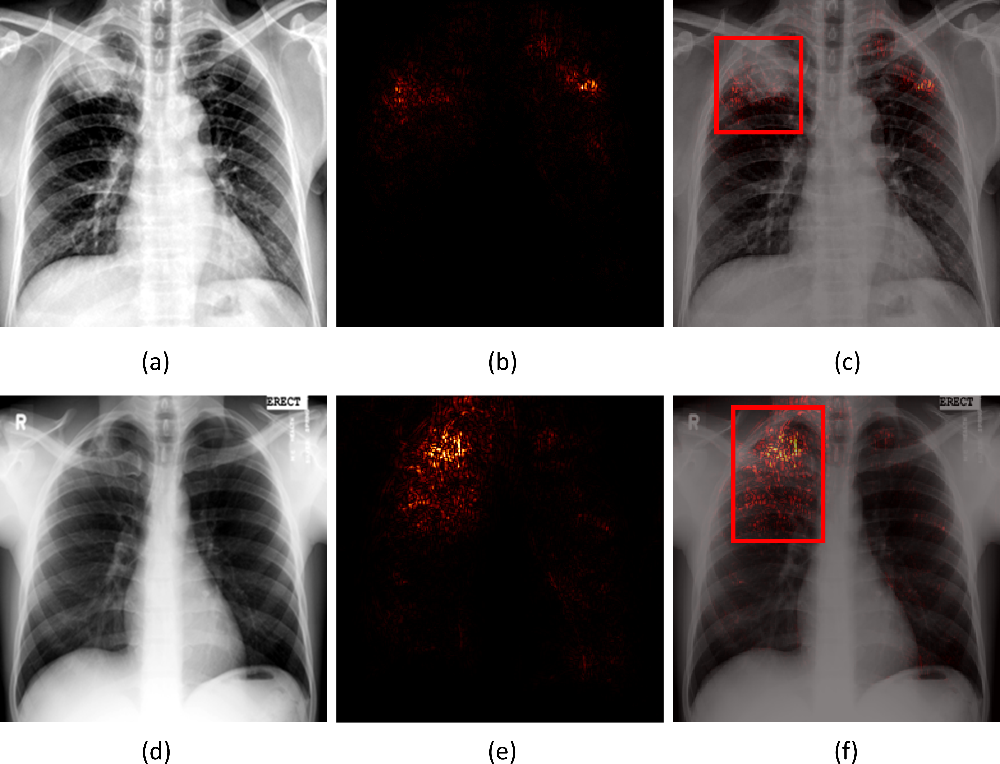

In [17]:
from IPython.display import Image
Image("saliency_overlap_shenzhentop_montbottom_with_gt.png", width = 700, height = 700)

#### Generate CRM Visualizations: Next we use CRM based visualization algorithm to localize the TB-specific ROIs in the image.

In [ ]:
img_width, img_height = 256, 256
#load model
vgg16_custom_model = load_model('weights/vgg16_finetuned.10-0.9154.h5')
vgg16_custom_model.summary()

#compile the model
sgd = SGD(lr=1e-3, decay=1e-6, momentum=0.9, nesterov=True) #optimize to your requirements
vgg16_custom_model.compile(optimizer=sgd,
              loss='categorical_crossentropy',
              metrics=['accuracy'])


In [ ]:
#path to image to visualize
from keras.preprocessing import image
img_path = 'patient3_1.png'
img = image.load_img(img_path)

#preprocess the image
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x /= 255 

#predict on the image
preds = vgg16_custom_model.predict(x)[0]
print(preds)

In [ ]:
#Define CRM visualization for the classification task:

def Generate_CRM_2Class(thisModel, thisImg_path, Threshold):             # generate Class Revlevance Map (CRM)
    try:
        # preprocess input image      
        width, height = thisModel.input.shape[1:3].as_list()
        original_img = cv2.imread(thisImg_path) 
        resized_original_image = cv2.resize(original_img, (width,height))        
    
        input_image = img_to_array(resized_original_image)
        input_image = np.array(input_image, dtype="float") /255.0       
        input_image = input_image.reshape((1,) + input_image.shape)
    
        class_weights = thisModel.layers[-1].get_weights()[0]
    
        get_output = K.function([thisModel.layers[0].input], [thisModel.layers[-4].output, 
                                 thisModel.layers[-1].output])
        [conv_outputs, predictions] = get_output([input_image])
        conv_outputs = conv_outputs[ 0, :, :, :]     
        final_output = predictions   
        
        wf0 = np.zeros(dtype = np.float32, shape = conv_outputs.shape[0:2])    
        wf1 = np.zeros(dtype = np.float32, shape = conv_outputs.shape[0:2])    
    
        for i, w in enumerate(class_weights[:, 0]):     
            wf0 += w * conv_outputs[:, :, i]           
        S0 = np.sum(wf0)           # score at node 0 in the final output layer
        for i, w in enumerate(class_weights[:, 1]):     
            wf1 += w * conv_outputs[:, :, i]             
        S1 = np.sum(wf1)           # score at node 1 in the final output layer
    
        #Calculate incremental MSE
        iMSE0 = np.zeros(dtype = np.float32, shape = conv_outputs.shape[0:2])
        iMSE1 = np.zeros(dtype = np.float32, shape = conv_outputs.shape[0:2])
    
        row, col = wf0.shape
        for x in range (row):
                for y in range (col):
                        tmp0 = np.array(wf0)
                        tmp0[x,y] = 0.                   # remove activation at the spatial location (x,y)
                        iMSE0[x,y] = (S0 - np.sum(tmp0)) ** 2
    
                        tmp1 = np.array(wf1)
                        tmp1[x,y] = 0.                  
                        iMSE1[x,y] = (S1 - np.sum(tmp1)) ** 2
         
      
        Final_crm = iMSE0 + iMSE1       # consider both positive and negative contribution
    
        Final_crm /= np.max(Final_crm)    # normalize
        resized_Final_crm = cv2.resize(Final_crm, (height, width)) # upscaling to original image size

        The_CRM = np.array(resized_Final_crm)
        The_CRM[np.where(resized_Final_crm < Threshold)] = 0.  # clean-up (remove data below threshold)

        return[resized_original_image, final_output, resized_Final_crm, The_CRM]
    except Exception as e:
        raise Exception('Error from Generate_CRM_2Class(): ' + str(e))

In [ ]:
#Generate CRM visualization with a single image

InImage1, OutScores1, aCRM_Img1, tCRM_Img1 = Generate_CRM_2Class(vgg16_custom_model,
                                                                 img_path, 0.1) 
plt.figure() # create a figure with the default size 
plt.imshow(InImage1)
aHeatmap = cv2.applyColorMap(np.uint8(255*aCRM_Img1), cv2.COLORMAP_JET)
aHeatmap[np.where(aCRM_Img1 < 0.2)] = 0   
superimposed_img = aHeatmap * 0.4 + InImage1 #0.4 here is a heatmap intensity factor.
#if we have to increse the DPI and write to disk
writePNGwithdpi(superimposed_img, "vgg16_vis1.png", (300,300))

In [ ]:
#running a loop to generate activations for a group of images

source = glob.glob("data\*.png")
source.sort()

#load model
vgg16_custom_model = load_model('weights/vgg16_finetuned.10-0.9154.h5')
vgg16_custom_model.summary()

#compile the model
sgd = SGD(lr=1e-3, decay=1e-6, momentum=0.9, nesterov=True) #optimize to your requirements
vgg16_custom_model.compile(optimizer=sgd,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

for f in source:
    img = image.load_img(f)
    img_name = f.split(os.sep)[-1]
    #preprocess the image
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x /= 255 
    #predict on the image
    preds = vgg16_custom_model.predict(x)[0]
    print(preds)
    InImage1, OutScores1, aCRM_Img1, tCRM_Img1 = Generate_CRM_2Class(vgg16_custom_model,
                                                                 f, 0.1) 
    aHeatmap = cv2.applyColorMap(np.uint8(255*aCRM_Img1), cv2.COLORMAP_JET)
    aHeatmap[np.where(aCRM_Img1 < 0.3)] = 0   
    superimposed_img = aHeatmap * 0.4 + InImage1 #0.4 here is a heatmap intensity factor.
    #if we have to increse the DPI and write to disk
    writePNGwithdpi(superimposed_img, 
                    "C:/Users/codes/activation/{}_crm_activation.png".format(img_name[:-4]), (300,300))

In [ ]:
# if you want to run the loop to generate grad-CAM-based activations to compare with CRM then do the following:

source = glob.glob("data\*.png")
source.sort()

#load model
vgg16_custom_model = load_model('weights/vgg16_finetuned.10-0.9154.h5')
vgg16_custom_model.summary()

#compile the model
sgd = SGD(lr=1e-3, decay=1e-6, momentum=0.9, nesterov=True) #optimize to your requirements
vgg16_custom_model.compile(optimizer=sgd,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

for f in source:
    img = image.load_img(f)
    img1 = cv2.imread(f)
    img_name = f.split(os.sep)[-1]
    #preprocess the image
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x /= 255 
    #predict on the image
    preds = vgg16_custom_model.predict(x)[0]
    # print(preds)
    #begin visualization
    covid_output = vgg16_custom_model.output[:, 0] #index 0 for abnormal
    #Output feature map from the last convolutional layer
    last_conv_layer = vgg16_custom_model.get_layer('block5_conv3')
    #compute the Gradient of the expected class 
    #with regard to the output feature map of block5_conv3 
    #(or the deepst convolutional layer)
    grads = K.gradients(covid_output, last_conv_layer.output)[0]
    #Vector of shape (512,), where each entry is the mean intensity 
    #of the gradient over a specific feature-map channel
    pooled_grads = K.mean(grads, axis=(0, 1, 2))
    #access the values of the quantities we defined: 
    #pooled_grads and the output feature map of block5_conv3, given a sample image
    iterate = K.function([vgg16_custom_model.input],[pooled_grads, last_conv_layer.output[0]])
    #Values of these two quantities, as Numpy arrays, given the sample image
    pooled_grads_value, conv_layer_output_value = iterate([x])
    #“how important this channel is” with regard to the expected class
    for i in range(512): #number of filters in the deepest convolutional layer
        conv_layer_output_value[:, :, i] *= pooled_grads_value[i]
    #For visualization purposes, we normalize the heatmap between 0 and 1.
    heatmap = np.mean(conv_layer_output_value, axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap) 
    #Resizes the heatmap to be the same size as the original image
    heatmap = cv2.resize(heatmap, (img1.shape[1], img1.shape[0]))
    aheatmap = cv2.applyColorMap(np.uint8(255*heatmap), cv2.COLORMAP_JET)
    aheatmap[np.where(heatmap < 0.2)] = 0  
    superimposed_img = aheatmap * 0.4 + img1 #0.4 here is a heatmap intensity factor.    
    writePNGwithdpi(superimposed_img, 
                    "C:/Users/codes/activation_gcam/{}_gcam_activation.png".format(img_name[:-4]), (300,300))


In [ ]:
# if you want to run the loop to generate grad-CAM pluls plus -based activations to compare with CRM anf grad-CAM then do the following:

source = glob.glob("data\*.png")
source.sort()

#load model
vgg16_custom_model = load_model('weights/vgg16_finetuned.10-0.9154.h5')
vgg16_custom_model.summary()

#compile the model
sgd = SGD(lr=1e-3, decay=1e-6, momentum=0.9, nesterov=True) #optimize to your requirements
vgg16_custom_model.compile(optimizer=sgd,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

for f in source:
    img = image.load_img(f)
    img1 = cv2.imread(f)
    img_name = f.split(os.sep)[-1]
    #preprocess the image
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x /= 255 
    cls = np.argmax(vgg16_custom_model.predict(x)[0])
    y_c = vgg16_custom_model.output[0, cls]
    conv_output = vgg16_custom_model.get_layer('block5_conv3').output
    #compute the Gradient of the expected class 
    #with regard to the output feature map of block5_conv3 
    #(or the deepst convolutional layer)
    grads = K.gradients(y_c, conv_output)[0]
    first = K.exp(y_c)*grads
    second = K.exp(y_c)*grads*grads
    third = K.exp(y_c)*grads*grads*grads
    gradient_function = K.function([vgg16_custom_model.input], 
                                       [y_c,first,second,third, conv_output, grads])
    y_c, conv_first_grad, conv_second_grad,conv_third_grad, conv_output, grads_val = gradient_function([x])
    global_sum = np.sum(conv_output[0].reshape((-1,conv_first_grad[0].shape[2])), axis=0)
    alpha_num = conv_second_grad[0]
    alpha_denom = conv_second_grad[0]*2.0 + conv_third_grad[0]*global_sum.reshape((1,1,conv_first_grad[0].shape[2]))
    alpha_denom = np.where(alpha_denom != 0.0, alpha_denom, np.ones(alpha_denom.shape))
    alphas = alpha_num/alpha_denom
    weights = np.maximum(conv_first_grad[0], 0.0)
    alpha_normalization_constant = np.sum(np.sum(alphas, axis=0),axis=0)
    alphas /= alpha_normalization_constant.reshape((1,1,conv_first_grad[0].shape[2]))
    deep_linearization_weights = np.sum((weights*alphas).reshape((-1,conv_first_grad[0].shape[2])),axis=0)
    #print deep_linearization_weights
    grad_CAM_map = np.sum(deep_linearization_weights*conv_output[0], axis=2)
    # Passing through ReLU
    heatmap = np.maximum(grad_CAM_map, 0)
    heatmap /= np.max(heatmap)
    #Resizes the heatmap to be the same size as the original image
    heatmap = cv2.resize(heatmap, (img1.shape[1], img1.shape[0]))
    aheatmap = cv2.applyColorMap(np.uint8(255*heatmap), cv2.COLORMAP_AUTUMN)
    aheatmap[np.where(heatmap < 0.3)] = 0  
    superimposed_img = aheatmap * 0.4 + img1 #0.4 here is a heatmap intensity factor.    
    writePNGwithdpi(superimposed_img, 
                    "C:/Users/codes/activation_gcam++/{}_gcam++_activation.png".format(img_name[:-4]), (300,300))


Once these activations are generated for all the images, the coarse activations need to be converted into bounding boxes.
We further converted these coarse TB ROI localizations to binary masks through a sequence of steps mentioned as follows: (i) we computed the difference between the CRM-overlaid image and the original image and converted it into a binary image; (ii) The parameters of the polygonal coordinates of the connected components in the binary image are measured. This gives the coordinates of the vertices and that of the line segments making up the sides of the polygon; (iii) A binary mask is then generated from the polygon and stored; and (iv) The original images and their associated TB ROI binary masks are used for further analysis. Figure below illustrates the sequence of steps involved in CRM-based TB ROI localization and binary mask generation.

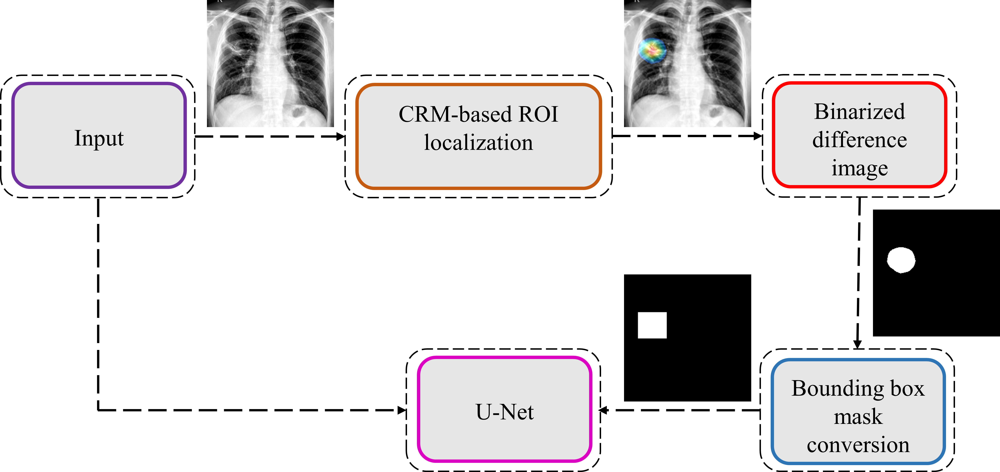

In [15]:
from IPython.display import Image
Image("crm_based_localization.png", width = 700, height = 700)

In [ ]:
#Matlab code:

% Find bounding box from CAM images
%% Load data, find mask image, find BB
clear
sheet={}; 
cam_folder_path = ['data/cam_vis'];
img_folder_path = ['data/image'];
save_folder_path = ['data/bbmask'];
save_folder_path_mask = ['data/bbmask/masks'];
save_folder_path_maskBB = ['data/bbmask/masks_bb'];

camfiles = dir(cam_folder_path);
imgfiles = dir(img_folder_path);
count=1;
for npat = 3:length(camfiles)
    patname = camfiles(npat).name;
    cam = imread([cam_folder_path filesep camfiles(npat).name]);
    img = imread([img_folder_path filesep imgfiles(npat).name]);

    diff_img = cam - img;
    gray_img = rgb2gray(diff_img);
    mask_img = gray_img>0;
    regs = regionprops(mask_img,'boundingbox');
    BB=[]; xi=[]; yi=[];
    for i=1:length(regs)
        BB(i,:) = regs(i).BoundingBox;   
        points = bbox2points(BB(i,:));
        xi = [xi points(:,1)];
        yi = [yi points(:,2)];
        sheet{count,1} = patname;
        for temp=2:5
            sheet{count,temp} = BB(i,temp-1);
        end
        count=count+1;
    end

    maskBB=[];
    for i=1:size(xi,2)
        maskBB(:,:,i) = poly2mask(xi(:,i),yi(:,i),size(mask_img,1),size(mask_img,2));
    end
    summaskBB = sum(maskBB,3);
    summaskBB(summaskBB>1) = 1;
    imwrite(mask_img,[save_folder_path_mask filesep patname],'png');
    imwrite(summaskBB,[save_folder_path_maskBB filesep patname],'png');

end

% Save output as CSV file
Final = cell2table(sheet,'VariableNames',{'Patient Name', 'xmin', 'ymin', 'width', 'height'});
output_csv_name = 'bbmask.csv';
writetable(Final, [save_folder_path filesep output_csv_name]);

#### The original CXRs and their associated bounding box masks are further used for training the TB detection models. For TB detection, the above lung segmentation code has to be used using the same models except that the path for the imges and mask folder should now contain the orgiinal CXRS and TB ROI specific masks.


'''The annotations of the indivdiual radiologists are stored in a JSON file. From the JSON file it is converted to a CSV file as shown below:
'''

In [ ]:
import json
with open('file.json') as f:
    data = json.load(f)
    
csv = open('radiology_markings.csv','w')
csv.write("filename,size,x,y,width,height\n")

im_data = data["_via_img_metadata"]
for info in im_data:
    if info.startswith('MCUCXR'):
        filename = im_data[info]['filename']
        size = im_data[info]['size']
        for region_info in im_data[info]['regions']:
            x = region_info['shape_attributes']['x']
            y = region_info['shape_attributes']['y']
            width = region_info['shape_attributes']['width']
            height = region_info['shape_attributes']['height']
            csv.write(filename+','+str(size)+','+str(x)+','+str(y)+','+str(width)+','+str(height)+'\n')
    
csv.close()

#### The CSV files so generated could be used further during the TB segmetnation stage and are rescaled because of lung cropping. The rescaled CSV file can then be used for generatig TB specific bounding box masks as shown below: 

In [ ]:
import pandas as pd
import cv2
import numpy as np
import glob
import os

source = glob.glob("C:/Users/codes/cropped/*.png")
source.sort()

df = pd.read_csv('C:/Users/codes/resizedtbroi.csv')
im_csv_np = df.loc[:,"image_names"].values
for f in source:
    img = cv2.imread(f)
    img_name = f.split(os.sep)[-1]
    mask = np.zeros((img.shape[0],img.shape[1]),dtype=np.uint8) # initialize mask
    idx = np.where(im_csv_np == img_name)
    if idx[0].shape[0]: # if there is a match shape[0] should 1, if not 0
        for k,i in enumerate(idx[0]):
            name = df.loc[i]['image_names']
            mask[df.loc[i]['ymin']:df.loc[i]['ymax'],df.loc[i]['xmin']:df.loc[i]['xmax']] = 255     
    cv2.imwrite("C:/Users/codes/masks_bb/{}.png".format(img_name[:-4],k+1),mask) # save mask   

#### Once the models are trained with the TB specific masks generated as mentioned above and the associated CXRs compute the confusion matrix and AUC metrics as shown above.

In [ ]:
#overlay the predicted and GT masks on the original image

img1 = cv2.imread('image1.png') #original image
img2 = cv2.imread('image1_pred.png') #predicted mask
img3 = cv2.imread('image1_gt.png') #ground truth mask

#convert images to grayscale
img_1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img_2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
img_3 = cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)

#convert original image to RGB
img1_color = cv2.cvtColor(img_1, cv2.COLOR_GRAY2RGB)

#find contours of the masks: GT and predicted
contours1, _ = cv2.findContours(img_2, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
contours2, _ = cv2.findContours(img_3, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

#Draw contours over the original image
#prediction red contour and gt is green contour
combined = cv2.drawContours(img1_color, contours1, -1, (0,0,255),5)
combined1 = cv2.drawContours(combined, contours2, -1, (0,255,0),5)

## if you want to fill the mask with pixels:
#combined = cv2.fillPoly(img1_color, contours1, color=(0,0,255))
#combined1 = cv2.fillPoly(combined, contours2, color=(0,0,255))
#cv2.imwrite("overlay.png",combined1)

#if we have to increse the DPI and write to disk
writePNGwithdpi(combined1, "overlay_bbPred_gt.png", (400,400))


We used the STAPLE algorithm to build a consensus ROI annotation from the experts’ annotations for the Shenzhen TB CXR-Subset-2 and Montgomery TB CXR data collections. Figure below shows instances of TB ROI annotations made by the radiologists R1, R2, and R3 and the STAPLE-generated consensus ROI for a CXR instance from the Shenzhen TB CXR-Subset-2 and Montgomery TB CXR collections respectively. STAPLE is widely used for validating the segmentation performance of the models by comparing them to that of expert annotations. An expectation-maximization methodology is used where the probabilistic estimate of a reference segmentation is computed from a collection of expert annotations and weighed by each expert’s estimated level of performance. The segmented regions are spatially distributed based on this knowledge, satisfying constraints of homogeneity. 

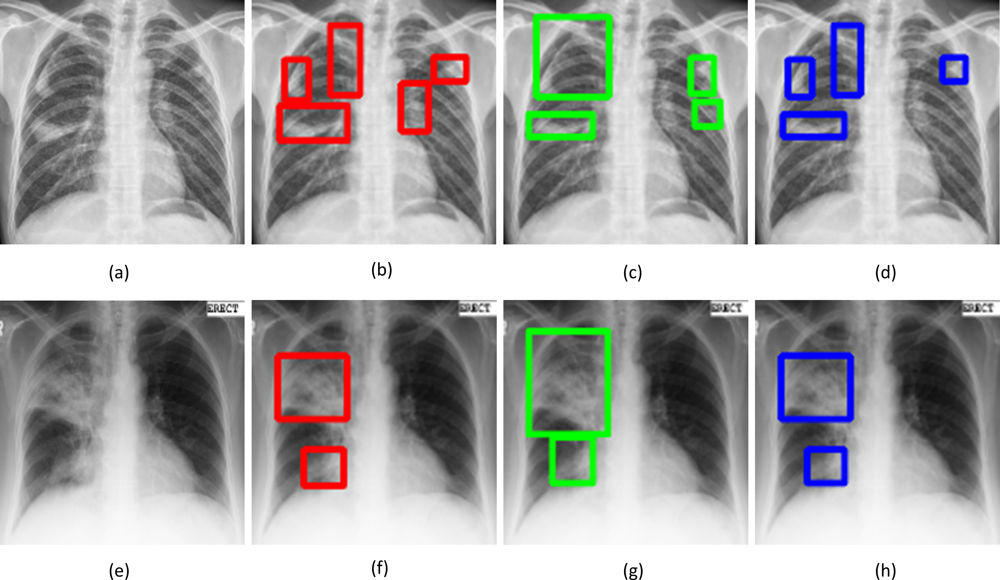

In [16]:
from IPython.display import Image
Image("staple_consensus.png", width = 700, height = 700)

In [ ]:
#load libraries

import SimpleITK as sitk
import numpy as np
from skimage.measure import label, regionprops
from skimage import io
from scipy.ndimage.morphology import binary_fill_holes
import os
import glob
import pandas as pd
import cv2

In [ ]:
#define evaluation functions:


def get_mask(img_name, df, h, w):
    im_csv_np = df.loc[:,"patientId"].values
    idx = np.where(im_csv_np == img_name)
    if idx[0].shape[0]: # if there is a match shape[0] should 1, if not 0
        mask = np.zeros((len(idx[0]),h,w))
        for k,j in enumerate(idx[0]):
            i = j.item()
            #name = df.loc[i]['patientId']
            mask[k,int(df.loc[i]['y_dis']):int(df.loc[i]['y_dis'])+int(df.loc[i]['height_dis']),
                        int(df.loc[i]['x_dis']):int(df.loc[i]['x_dis'])+int(df.loc[i]['width_dis'])] = 1.0
    else:
        mask = np.zeros((1,h,w))
    return mask

def multi_dim_mask(mask):
    labels = label(mask)
    maskf = np.zeros((np.max(labels),mask.shape[0],mask.shape[1]))
    for label_idx in range(np.max(labels)):
        maskf[label_idx][labels == label_idx+1] = 1.0
    return maskf
    
def ref_generator(masks):
    segmentations = []
    for m in masks:
        mask = m.astype(np.int8)
        sitk_m = sitk.GetImageFromArray(np.sum(mask,0))
        segmentations.append(sitk_m)
    foregroundValue = 1 
    threshold = 0.6 
    reference_segmentation_STAPLE_probabilities = sitk.STAPLE(segmentations, foregroundValue) 
    # We use the overloaded operator to perform thresholding, another option is to use the BinaryThreshold function.
    reference_segmentation_STAPLE = reference_segmentation_STAPLE_probabilities > threshold
    ref_mask = sitk.GetArrayFromImage(reference_segmentation_STAPLE)
    ref_mask = binary_fill_holes(ref_mask).astype(np.float64)
    ref_mask_ = ref_mask.astype(np.uint8)
    ref_mask_[ref_mask_==1] = 255
    ref_mask = multi_dim_mask(ref_mask)
    return ref_mask, ref_mask_

def jaccard_index(a,b): 
    intersection = np.sum(np.multiply(a,b))
    union = np.sum(a+b) - intersection
    return intersection/union

def dice_score(a,b): 
    num = 2 * np.sum(np.multiply(a,b))
    den = np.sum(a) + np.sum(b)
    return num/den

def kappa_eval(ref,mask,thr, metric = 'jaccard'): #can also use dice score
    TP = 0
    FP = 0
    FN = 0
    TN = 0
    
    if ref.any() or mask.any():
        for i in range(len(mask)):
            for j in range(len(ref)):
                if metric == 'jaccard':
                    iou_val = jaccard_index(mask[i],ref[j])
                else:
                    iou_val = dice_score(mask[i],ref[j])
                if iou_val >= thr:
                    TP += 1
                elif iou_val < thr and iou_val > 0:
                    FP += 1
        for k in range(len(mask)):
            if np.sum(np.multiply(mask[k],np.sum(ref,0))) == 0:
                FP += 1
        if len(ref) > TP+FP:
            FN += len(ref) - (TP+FP)
    else:
        TN = 1
    
    print("TP: {}, FP: {}, FN: {}, TN: {}".format(TP,FP,FN,TN))
    print("*"*20)
    return TP,FP,FN,TN

def eval_metric(TP, FP, FN, TN):
    po = (TP+TN)/(TP+FP+FN+TN)
    p_true = ((TP+FN)*(TP+FP))/((TP+FP+FN+TN)**2)
    p_false = ((FP+TN)*(FN+TN))/((TP+FP+FN+TN)**2)
    pe = p_true + p_false
    # Cohen's Kappa
    if pe == 1:
        k = 1
    else:
        k = (po - pe)/(1-pe)
    return k

def overlay(org_img,ref,mask):
    org_img = cv2.cvtColor(org_img,cv2.COLOR_GRAY2RGB)
    cm_overlay = org_img.copy()
    # Ref red contours
    for i in range(len(ref)):
        contours, _ = cv2.findContours(ref[i].astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        for contour in contours:
            cv2.drawContours(cm_overlay, contour, -1, (255, 0, 0), 3)    
    # test blue contours
    for j in range(len(mask)):
        contours2, _ = cv2.findContours(mask[j].astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        for contour2 in contours2:
            cv2.drawContours(cm_overlay, contour2, -1, (0, 0, 255), 3)   
    return cm_overlay

def sensitivity_metric(TP, FP, FN, TN):
    
    pnum = TP/(TP + FN)
    return pnum

def specificity_metric(TP, FP, FN, TN):
    
    pnum = TN/(TN + FP)
    return pnum

def ppv_metric(TP, FP, FN, TN):
    
    pnum = TP/(TP + FP)
    return pnum

def npv_metric(TP, FP, FN, TN):
    
    pnum = TN/(TN + FN)
    return pnum

In [ ]:
# Generating consensus ROI

if __name__ == '__main__':
    rad = 'radiologist1' 
    metric = 'dice' # ['jaccard','dice']
    iou_thr = 0.5 # [0.1, 0.2, ...]
    
    filenames = glob.glob("cropped/*.png")
    filenames.sort()
    # rad1
    df1 = pd.read_csv('rad1.csv')
    # rad2
    df2 = pd.read_csv('rad2.csv')
    
    TP = 0
    FP = 0
    FN = 0
    TN = 0
    
    csv = open('staple.csv','w')
    csv.write("patientId,x_dis,y_dis,width_dis,height_dis,Labels\n")
    
    for f in filenames:
        img = cv2.imread(f, cv2.IMREAD_GRAYSCALE)
        h,w = img.shape
        img_name = f.split(os.sep)[-1]
        print(img_name)
        mask1 = get_mask(img_name, df1, h, w)
        mask2 = get_mask(img_name, df2, h, w)       
        ref_mask,ref_mask_ = ref_generator(masks = (mask1,mask2))     

        ref_mask_overlay = cv2.cvtColor(img,cv2.COLOR_GRAY2RGB)
        for i in range(len(ref_mask)):
            props = regionprops(ref_mask[i].astype(np.int8))[0]
            df_csv = {"patientId": img_name,
                      "x_dis": props.bbox[1],
                      "y_dis": props.bbox[0],
                      "width_dis": abs(props.bbox[3]-props.bbox[1]),
                      "height_dis": abs(props.bbox[2]-props.bbox[0]),
                      "Labels": "TB"}
            csv.write(img_name+','+str(props.bbox[1])+','+str(props.bbox[0])+','+str(abs(props.bbox[3]-props.bbox[1]))+','+str(abs(props.bbox[2]-props.bbox[0]))+','+'TB'+'\n')
            contours, _ = cv2.findContours(ref_mask[i].astype(np.uint8), 
                                           cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
            for contour in contours:
                cv2.drawContours(ref_mask_overlay, contour, -1, (255, 0, 0), 3)
        
    csv.close()

Finally, we measure the confidence interval using the Epitools available at https://epitools.ausvet.com.au/ciproportion. 
This utility calculates confidence limits for a population proportion for a specified level of confidence.
Inputs are the sample size (say N=200) and number of positive results (TPs, say N=100), the desired level of confidence in the estimate and the number of decimal places required in the answer.
The program outputs the estimated proportion plus upper and lower limits of the specified confidence interval, using 5 alternative calculation methods decribed and discussed in Brown, LD, Cat, TT and DasGupta, A (2001). Interval Estimation for a proportion. Statistical Science 16:101-133: They are:
1. Asymptotic (Wald) method based on a normal approximation;
2. Binomial (Clopper-Pearson) "exact" method based on the beta distribution;
3. Wilson" Score interval;
4. "Agresti-Coull" (adjusted Wald) interval; and
5. "Jeffreys" interval.

In this study, we used the Binomial (Clopper-Pearson) "exact" method. 